## Py-imp is the section of the project that is implemented using Python
This notebook is the modelling section

In [1]:
# Warning options (before all imports)
import warnings
warnings.filterwarnings('ignore')
# warnings.simplefilter(action='ignore', category=UserWarning)
# warnings.simplefilter(action='ignore', category=FutureWarning)
# %xmode Verbose # simplified traceback when an exception occurs
%xmode Plain

Exception reporting mode: Plain


### Install needed packages


In [2]:
# Install a conda package in the current Jupyter kernel
import sys
# !mamba install -c conda-forge --yes --prefix {sys.prefix} <pkg>
# !conda install -c conda-forge --yes --prefix {sys.prefix} <pkg>

# Install a pip package in the current Jupyter kernel
# import sys
# !{sys.executable} - m pip install <pkg>

In [3]:
# 'sklearn for Time series data'
# !mamba install -c conda-forge --yes --prefix {sys.prefix} sktime-all-extras
# 'for Time series data'
# !mamba install -c conda-forge --yes --prefix {sys.prefix} feature_engine
# !mamba install -c conda-forge --yes --prefix {sys.prefix} mlxtend
# !mamba install -c conda-forge --yes --prefix {sys.prefix} statsmodels
# !mamba install -c conda-forge --yes --prefix {sys.prefix} ptitprince

# for tf.keras.utils.plot_model
# !mamba install -c conda-forge --yes --prefix {sys.prefix} graphviz python-graphviz

# # upgrade pip
# !{sys.executable} -m pip install --upgrade pip

# # Debug pip
# # Uninstall SetupTools:
# !{sys.executable} -m pip uninstall pip setuptools
# # Reinstall Setuptools:
# !{sys.executable} -m pip install --upgrade setuptools

# feature engineering Time series data
# !{sys.executable} -m pip install tsfresh
# pretty Matplotlib plots
# !{sys.executable} -m pip install git+https://github.com/iammelvink/LovelyPlots
# better progress bar
# !{sys.executable} -m pip install rich
# better 'describe'
# !{sys.executable} -m pip install skimpy
# For size encoded heatmaps
# !{sys.executable} -m pip install heatmapz
# XGBoost
# !{sys.executable} -m pip install xgboost
# !{sys.executable} -m pip install lightgbm
# !{sys.executable} -m pip install catboost
# !{sys.executable} -m pip install fastprogress
# !{sys.executable} -m pip install matplotx[all]
# !{sys.executable} -m pip install matplotx
# !{sys.executable} -m pip install lux
# !jupyter nbextension install --py luxwidget
# !jupyter nbextension enable --py luxwidget

# !{sys.executable} -m pip install sweetviz
# !{sys.executable} -m pip install yellowbrick
# !{sys.executable} -m pip install autoviz
# !{sys.executable} -m pip install pandas-profiling
# !{sys.executable} -m pip install dtale
# !{sys.executable} -m pip install sketch
# !{sys.executable} -m pip install watermark
# !{sys.executable} -m pip install snoop
# for tf.keras.utils.plot_model
# !{sys.executable} -m pip install pydot
# for optimising hyperparameters
# !{sys.executable} -m pip install optuna
# to save models to files
# !{sys.executable} -m pip install joblib
# for creating visualisations of model architectures
# !{sys.executable} -m pip install git+https://github.com/paulgavrikov/visualkeras
# !{sys.executable} -m pip install git+https://github.com/RedaOps/ann-visualizer
# !{sys.executable} -m pip install visualkeras

# for feature selection
# !{sys.executable} -m pip install Boruta
# for feature selection BorutaShap
# !{sys.executable} -m pip install git+https://github.com/Ekeany/Boruta-Shap
# !{sys.executable} -m pip install BorutaShap
# for feature selection using SHAP
# !{sys.executable} -m pip install shap-hypetune
# to export .ipynb to .pdf
# !{sys.executable} -m pip install nbconvert
# !{sys.executable} -m pip install adjustText

# to save models to files
# !mamba install -c conda-forge --yes --prefix {sys.prefix} h5py==3.9.0 --force-reinstall
# !{sys.executable} -m pip install h5py==3.9.0 --force-reinstall

# !{sys.executable} -m pip install matplotlib --force-reinstall
# !{sys.executable} -m pip install matplotlib pandas==1.5.3 --force-reinstall

In [4]:
# %pip install <pkg> --user

### Importing libraries


In [5]:
import snoop

snoop.install()
%load_ext snoop
# eg. put this before debug code %%snoop

from skimpy import skim  # better describe
from rich.progress import track
import os, random
from io import BytesIO
import timeit

import math
from scipy.stats import chi2_contingency

# Dataset reducer
# Source: https://www.kaggle.com/code/joseguzman/reducing/notebook
from reducing import PandaReducer

# Local ChatGPT-ish
import sketch
os.environ["SKETCH_MAX_COLUMNS"] = "300"
os.environ["SKETCH_ROW_OVERRIDE_LIMIT"] = "5"

# Run locally
# os.environ["LAMBDAPROMPT_BACKEND"] = "StarCoder"
# os.environ["SKETCH_USE_REMOTE_LAMBDAPROMPT"] = "False"
# os.environ["HF_ACCESS_TOKEN"] = "your_hugging_face_token"

# EDA
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import cycler
from matplotlib import rcParams
# matplotlib extensions
import matplotx
# For better distribution plots
# import ptitprince as pt
# For size encoded heatmaps
from heatmap import *
# from adjustText import adjust_text

# Pre-processing
from sklearn.preprocessing import *
from feature_engine.creation import CyclicalFeatures
from feature_engine.datetime import DatetimeFeatures
from feature_engine.imputation import DropMissingData
from feature_engine.selection import DropFeatures
from feature_engine.timeseries.forecasting import *
from mlxtend.evaluate.time_series import *
import datetime
from datetime import datetime as dt
from dateutil.relativedelta import *
from sklearn.compose import *
from sklearn.preprocessing import *
from sklearn.impute import *
from sklearn.pipeline import *
import itertools

# Modeling
import tensorflow as tf
from tensorflow.keras.utils import *
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.model_selection import *
from sklearn.model_selection import *
from sktime.utils.plotting import plot_series
from sklearn.utils import *
from sklearn.ensemble import *
from sklearn.naive_bayes import *
from sklearn.metrics import *
from sklearn import metrics
from sklearn.linear_model import *
from sklearn.neighbors import *
from sklearn.tree import *
from sklearn.svm import *
from xgboost import *
from lightgbm import *
from catboost import *
from sklearn.utils.class_weight import *
from sklearn.exceptions import NotFittedError

# To save models to files
# import pickle
import joblib # for saving models to .pkl or.sav files, for scikit-learn models
import h5py # for saving models to .hdf5 files, for TensorFlow models
from tensorflow.keras.models import *
# saved_model = load_model('model_name.hdf5')

# for optimising hyperparameters
import optuna
# to visualise of model architectures
import visualkeras
# from ann_visualizer.visualize import ann_viz;
from shaphypetune import *

np.set_printoptions(linewidth=140)

# Pandas options
# pd.options.display.precision = 3
pd.options.display.max_rows = 50
pd.options.display.max_columns = 50
pd.options.mode.chained_assignment=None

pd.set_option('display.width', 140)

# Display Pipelines and models
from sklearn import set_config
set_config(display='diagram')

plt.style.reload_library()
# plt.style.use(matplotx.styles.dufte)
# plt.style.use('ipynb') # prettier plots
plt.style.use(['ipynb', 'colors10-markers'])
# Always put after custom styles
rcParams['axes.spines.top'] = False # remove top border of plot
rcParams['axes.spines.bottom'] = True # keep top border of plot
rcParams['axes.spines.left'] = True # keep top border of plot
rcParams['axes.spines.right'] = True # keep top border of plot
# rcParams['axes.grid' ] = True
rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"] # reset figsize
from PIL import ImageFont

font = ImageFont.truetype("arial.ttf", 22)  # using comic sans is strictly prohibited!

# To display charts in Jupyter
%matplotlib inline

# Matplotlib options
rcParams['figure.dpi'] = 600
# rcParams['figure.figsize'] = 8, 6
rcParams['legend.fontsize'] = "large"
rcParams['xtick.major.size'] = 4
rcParams['xtick.minor.size'] = 1
rcParams["figure.autolayout"] = True

# For reproducibility
# rng = np.random.RandomState(0)
rng = 777
os.environ['PYTHONHASHSEED'] = str(rng)
random.seed(rng)
np.random.seed(rng)
tf.random.set_seed(rng)

# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) `tensorflow` random seed
# 3) `python` random seed
tf.keras.utils.set_random_seed(rng)

# This will make TensorFlow ops as deterministic as possible, but it will
# affect the overall performance, so it's not enabled by default.
# `enable_op_determinism()` is introduced in TensorFlow 2.9.
# tf.config.experimental.enable_op_determinism()
os.environ['TF_DETERMINISTIC_OPS'] = "True"
os.environ["TF_DISABLE_SEGMENT_REDUCTION_OP_DETERMINISM_EXCEPTIONS"] = "True"

In [6]:
%load_ext watermark
# %watermark
%watermark --iversions

sketch     : 0.4.2
keras      : 2.10.0
PIL        : 9.5.0
tensorflow : 2.10.1
pandas     : 1.5.3
joblib     : 1.3.2
hyperopt   : 0.2.5
optuna     : 3.3.0
sklearn    : 1.3.1
visualkeras: 0.0.2
xgboost    : 2.0.0
sys        : 3.8.18 | packaged by conda-forge | (default, Oct 10 2023, 15:37:54) [MSC v.1929 64 bit (AMD64)]
seaborn    : 0.11.0
h5py       : 3.9.0
matplotx   : 0.3.10
numpy      : 1.23.5
matplotlib : 3.7.1
scipy      : 1.10.1



In [7]:
# Helper functions for categorical type casting
def summarize_categoricals(df, show_levels=False):
    """
        Display uniqueness in each column
    """
    data = [[df[c].unique(), len(df[c].unique()), df[c].isnull().sum()]
            for c in df.columns]
    df_temp = pd.DataFrame(data, index=df.columns,
                           columns=['Levels', 'No. of Levels',
                                    'No. of Missing Values'])
    return df_temp.iloc[:, 0 if show_levels else 1:]


def return_categoricals(df, threshold=5):
    """
        Returns a list of columns that have less than or equal to
        `threshold` number of unique categorical levels
    """
    return list(filter(lambda c: c if len(df[c].unique()) <= threshold else None,
                       df.columns))


def to_categorical(columns, df):
    """
        Converts the columns passed in `columns` to categorical datatype
    """
    for col in columns:
        df[col] = df[col].astype('category')
    return df

In [8]:
# allow memory growth of GPU
physical_devices = tf.config.experimental.list_physical_devices('GPU')
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

<a id="import-and-clean-data"></a>
## 1.   Import and Clean Data

In [9]:
data_path = "../../data/d_machines_cleaned/"

df_pdm_machines = PandaReducer().reduce(
    pd.read_csv(f"{data_path}/final_pdm_machines_cleaned.csv", parse_dates=["datetime"]))

# # Changing format's of date-time columns. Sort based on date for better readability
tables = [df_pdm_machines]
for dataset in tables:
    dataset.sort_values(["datetime", "machineID"],
    inplace=True, ignore_index=True)

Dataset reduced 62.81% : 89.12 to 33.14 MB in 2.97 seconds


In [10]:
to_cast = return_categoricals(df_pdm_machines, threshold=5)
df_pdm_machines = to_categorical(to_cast, df_pdm_machines)
df_pdm_machines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292019 entries, 0 to 292018
Data columns (total 40 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   datetime                292019 non-null  datetime64[ns]
 1   machineID               292019 non-null  int8          
 2   volt_lag_mean_3h        292019 non-null  float32       
 3   rotate_lag_mean_3h      292019 non-null  float32       
 4   pressure_lag_mean_3h    292019 non-null  float32       
 5   vibration_lag_mean_3h   292019 non-null  float32       
 6   volt_lag_sd_3h          292019 non-null  float32       
 7   rotate_lag_sd_3h        292019 non-null  float32       
 8   pressure_lag_sd_3h      292019 non-null  float32       
 9   vibration_lag_sd_3h     292019 non-null  float32       
 10  volt_lag_mean_24h       292019 non-null  float32       
 11  rotate_lag_mean_24h     292019 non-null  float32       
 12  pressure_lag_mean_24h   292019

In [11]:
print(f"Summary for DataFrame: df_pdm_machines")
summarize_categoricals(df_pdm_machines, show_levels=True)

Summary for DataFrame: df_pdm_machines


,Levels,No. of Levels,No. of Missing Values
datetime,"[2015-01-01T09:00:00.000000000, 2015-01-01T12:...",2920,0
machineID,"[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 1...",100,0
volt_lag_mean_3h,"[167.69434, 176.97246, 168.9199, 172.523, 147....",267927,0
rotate_lag_mean_3h,"[437.2089, 482.49496, 472.07178, 493.32242, 43...",275958,0
pressure_lag_mean_3h,"[94.93005, 99.352455, 90.04281, 97.962135, 152...",272261,0
vibration_lag_mean_3h,"[40.247875, 33.345875, 45.85976, 40.632053, 32...",275233,0
volt_lag_sd_3h,"[9.150737, 10.233862, 11.682536, 17.751614, 9....",290228,0
rotate_lag_sd_3h,"[15.576324, 31.894785, 62.903927, 35.574364, 6...",290166,0
pressure_lag_sd_3h,"[17.636868, 11.060139, 7.5677595, 18.505117, 8...",290155,0
vibration_lag_sd_3h,"[3.2832463, 4.651387, 8.0258665, 3.508214, 10....",290224,0


Descriptive statistics for df_pdm_machines data

In [12]:
print("Total number of df_pdm_machines records: %d" % len(df_pdm_machines.index))
print(df_pdm_machines.head(3))
# skim(df_pdm_machines)
df_pdm_machines.describe().T.style.background_gradient(axis=0, cmap='YlOrRd')

Total number of df_pdm_machines records: 292019
             datetime  machineID  volt_lag_mean_3h  rotate_lag_mean_3h  pressure_lag_mean_3h  vibration_lag_mean_3h  volt_lag_sd_3h  \
0 2015-01-01 09:00:00          2        167.694336          437.208893             94.930054              40.247875        9.150737   
1 2015-01-01 09:00:00          3        176.972458          482.494965             99.352455              33.345875       10.233862   
2 2015-01-01 09:00:00          4        168.919907          472.071777             90.042809              45.859760       11.682536   

   rotate_lag_sd_3h  pressure_lag_sd_3h  vibration_lag_sd_3h  volt_lag_mean_24h  rotate_lag_mean_24h  pressure_lag_mean_24h  \
0         15.576324           17.636868             3.283246         169.368378           450.479523              96.100517   
1         31.894785           11.060139             4.651387         173.228378           452.886475             100.159653   
2         62.903927           

,count,mean,std,min,25%,50%,75%,max
machineID,292019.000000,50.503025,28.864336,1.000000,26.000000,51.000000,76.000000,100.000000
volt_lag_mean_3h,292019.000000,170.778885,9.502797,125.532501,164.450340,170.435257,176.613693,241.420715
rotate_lag_mean_3h,292019.000000,446.598053,33.138813,211.811172,427.550095,448.377655,468.444489,586.682922
pressure_lag_mean_3h,292019.000000,100.860214,7.417788,72.118637,96.238964,100.234825,104.407444,162.309647
vibration_lag_mean_3h,292019.000000,40.385387,3.479337,26.569635,38.147839,40.145905,42.228165,69.311325
volt_lag_sd_3h,292019.000000,13.299464,6.966437,0.025508,8.027443,12.495745,17.689126,58.444332
rotate_lag_sd_3h,292019.000000,44.456505,23.216949,0.078993,26.904894,41.793873,59.104218,179.903046
pressure_lag_sd_3h,292019.000000,8.885712,4.656142,0.027416,5.370357,8.345924,11.789967,35.659363
vibration_lag_sd_3h,292019.000000,4.441186,2.320377,0.015277,2.684608,4.173967,5.900296,18.305595
volt_lag_mean_24h,292019.000000,170.739258,4.180553,156.713608,168.100807,170.285858,172.609818,206.333893


In [13]:
# Duration of the df_pdm_machines data
print("Duration of the df_pdm_machines data:")
df_pdm_machines.datetime.min(), df_pdm_machines.datetime.max()

Duration of the df_pdm_machines data:


(Timestamp('2015-01-01 09:00:00'), Timestamp('2016-01-01 06:00:00'))

<a id="data-preprocessing"></a>
## 4.   Data Preprocessing

Data needs to be one-hot-encoded before applying machine learning models.

#### Using first 20000 to experiment with

In [14]:
# Using first 20000 to experiment with
# df_pdm_machines = df_pdm_machines.iloc[:20000]

In [15]:
# Drop datatime because this is a prediction and not forecasting
# Drop machineID because it can be compared to a person's ID number which is not useful for the model
# Drop model of machine because this problem is focusing on failures by component level
df_pdm_machines.drop(['datetime', 'machineID', 'model'], axis=1, inplace=True)

In [16]:
# reduce size of the dataframe
df_pdm_machines = PandaReducer().reduce(df_pdm_machines)
df_pdm_machines.info()

Dataset reduced 0.00% : 29.52 to 29.52 MB in 0.46 seconds
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292019 entries, 0 to 292018
Data columns (total 37 columns):
 #   Column                  Non-Null Count   Dtype   
---  ------                  --------------   -----   
 0   volt_lag_mean_3h        292019 non-null  float32 
 1   rotate_lag_mean_3h      292019 non-null  float32 
 2   pressure_lag_mean_3h    292019 non-null  float32 
 3   vibration_lag_mean_3h   292019 non-null  float32 
 4   volt_lag_sd_3h          292019 non-null  float32 
 5   rotate_lag_sd_3h        292019 non-null  float32 
 6   pressure_lag_sd_3h      292019 non-null  float32 
 7   vibration_lag_sd_3h     292019 non-null  float32 
 8   volt_lag_mean_24h       292019 non-null  float32 
 9   rotate_lag_mean_24h     292019 non-null  float32 
 10  pressure_lag_mean_24h   292019 non-null  float32 
 11  vibration_lag_mean_24h  292019 non-null  float32 
 12  volt_lag_sd_24h         292019 non-null  float32 
 13  r

In [17]:
X = df_pdm_machines.iloc[:, :-1]
# X = df_pdm_machines.drop(['datetime', 'machineID', 'model'], axis=1).iloc[:, :-1]
y = df_pdm_machines['failure']

#### Features before feature selection

In [18]:
X.shape

(292019, 36)

In [19]:
X.head(3)

,volt_lag_mean_3h,rotate_lag_mean_3h,pressure_lag_mean_3h,vibration_lag_mean_3h,volt_lag_sd_3h,rotate_lag_sd_3h,pressure_lag_sd_3h,vibration_lag_sd_3h,volt_lag_mean_24h,rotate_lag_mean_24h,pressure_lag_mean_24h,vibration_lag_mean_24h,volt_lag_sd_24h,rotate_lag_sd_24h,pressure_lag_sd_24h,vibration_lag_sd_24h,error1count,error2count,error3count,error4count,error5count,comp1,comp2,comp3,comp4,age,datetime_month,datetime_week,datetime_day_of_week,datetime_day_of_month,datetime_hour,datetime_weekend,datetime_month_sin,datetime_month_cos,datetime_hour_sin,datetime_hour_cos
0,167.694336,437.208893,94.930054,40.247875,9.150737,15.576324,17.636868,3.283246,169.368378,450.479523,96.100517,39.821854,11.344186,56.997864,9.632777,4.672664,0,0,0,0,0,199.125,139.125,169.125,34.125,7,1,1,3,1,9,0,0.5,0.866025,0.433884,-0.900969
1,176.972458,482.494965,99.352455,33.345875,10.233862,31.894785,11.060139,4.651387,173.228378,452.886475,100.159653,37.333725,12.622225,59.955311,12.204017,5.097741,0,0,0,0,0,139.125,34.125,199.125,184.125,8,1,1,3,1,9,0,0.5,0.866025,0.433884,-0.900969
2,168.919907,472.071777,90.042809,45.859760,11.682536,62.903927,7.567760,8.025867,169.122009,456.221405,99.904404,39.504959,12.179081,61.278572,8.771438,3.869699,0,0,0,0,0,154.125,199.125,49.125,19.125,7,1,1,3,1,9,0,0.5,0.866025,0.433884,-0.900969


#### Load trained feature selection model for modelling phase

In [20]:
# # load the model from disk
filename = '../../code/machines/models/four_phase_selector.sav'
boruta_shap_selector = joblib.load(open(filename, 'rb'))

In [21]:
X_reduced = boruta_shap_selector.Subset()

In [22]:
# print(boruta_shap_selector.Subset().columns)

In [23]:
col_list = X_reduced.columns.tolist()

#### Apply feature selection

In [24]:
X = X.loc[:, col_list]

In [25]:
X.shape

(292019, 13)

In [26]:
X.head(3)

,error3count,error5count,datetime_day_of_month,datetime_hour_sin,error1count,error4count,error2count,datetime_week,comp1,age,comp2,comp4,comp3
0,0,0,1,0.433884,0,0,0,1,199.125,7,139.125,34.125,169.125
1,0,0,1,0.433884,0,0,0,1,139.125,8,34.125,184.125,199.125
2,0,0,1,0.433884,0,0,0,1,154.125,7,199.125,19.125,49.125


In [27]:
# OR, load CSV file with list of features to keep
# features_to_keep = pd.read_csv("../../code/machines/models/features_to_keep.csv", header=None)
# features_to_keep = features_to_keep.values.tolist()

In [28]:
# print(len(features_to_keep))

In [29]:
# features_to_keep

<a id="train-test-split"></a>
### 4.1.   Train-Test split
CatBoost classifier does not require any knd of preprocessing while Naive bayes requires a different kind of preprocesing. Therefore, we will use raw/ unmodified data (`X_train_cat, X_test_cat, y_train_cat, y_test_cat`) for CatBoost and preprocessed data (`X_train, X_test, y_train, y_test`) for all other classifiers. For Naive Bayes, we will use the raw data (`X_train_cat, X_test_cat, y_train_cat, y_test_cat`) and preprocess it as required in the Naive Bayes section.

In [30]:
categorical_columns = list(X.select_dtypes(include='category').columns)
numeric_columns = list(X.select_dtypes(exclude='category').columns)

In [31]:
data_splits = temporal_train_test_split(X, y, test_size=0.30)
X_train, X_test, y_train, y_test = data_splits

# For CatBoost and Naive Bayes
data_splits = temporal_train_test_split(X, y, test_size=0.30)
X_train_cat, X_test_cat, y_train_cat, y_test_cat = data_splits

list(map(lambda X: X.shape, [X, y, X_train, X_test, y_train, y_test]))

[(292019, 13), (292019,), (204413, 13), (87606, 13), (204413,), (87606,)]

In [32]:
# fig, ax = plot_series(y_train, y_test, labels=["y_train", "y_test"])

In [33]:
pd.Series(y).value_counts()

none     286232
comp2      2009
comp1      1536
comp4      1264
comp3       978
Name: failure, dtype: int64

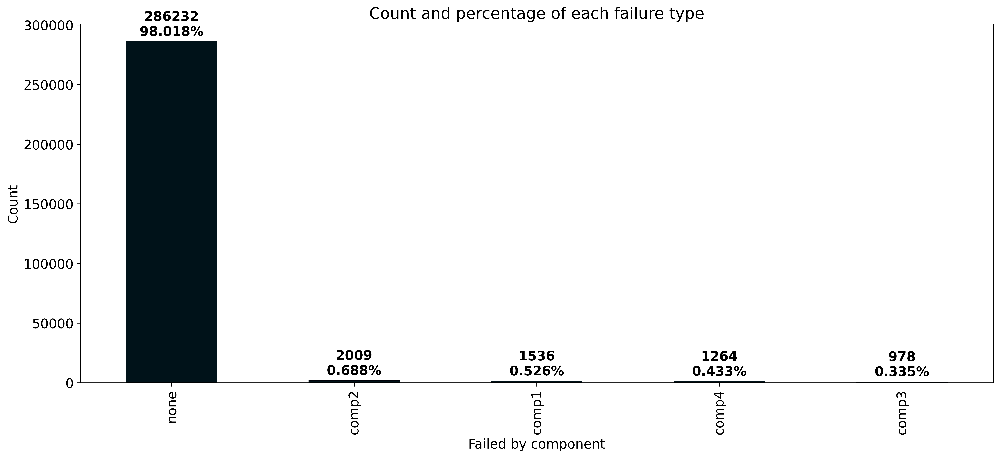

In [34]:
plt.figure(figsize=(15, 7))
ax = pd.Series(y).value_counts().plot(kind='bar')
plt.ylabel('Count')
plt.xlabel('Failed by component')
plt.title('Count and percentage of each failure type')
total = pd.Series(y).count()
for p in ax.patches:
    count = p.get_height()
    percent = '{:.3f}%'.format(100 * count / total)
    ax.annotate(str(count) + '\n' + percent + '\n', (p.get_x() + p.get_width() / 2., p.get_height()),
                va='center', ha='center', fontweight='bold', 
                color='#000', xytext=(0, 10), textcoords='offset points')
plt.show();

<a id="preprocessing-pipeline%3A-one-hot-encoding%2C-standardization"></a>
### 4.2.   Preprocessing Pipeline: One-hot Encoding, Standardization
We need to standardize the continuous or quantitative variables/ features before applying Machine Learning models. This is important because if we don't standardize the features, features with high variance that are orders of magnitude larger that others might dominate the model fitting process and causing the model unable to learn from other features (with lower variance) correctly as expected. <br/>
There is no need to standardize categorical variables.

To know which algorithms require standardization/ feature scaling read this useful [stackoverflow post](https://stats.stackexchange.com/questions/244507/what-algorithms-need-feature-scaling-beside-from-svm).

***Also we need to standardize the data only after performing train-test split because if we standardize before splitting then there is a chance for some information leak from the test set into the train set. We always want the test set to be completely new to the ML models. [Read more](https://scikit-learn.org/stable/modules/compose.html#columntransformer-for-heterogeneous-data)***

In [35]:
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(drop='first', dtype=np.int8))]) # np.int8 = 0 to 255, 1 byte. ONLY POSITIVE INTEGERS

## Column Transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_columns),
        ('cat', categorical_transformer, categorical_columns)],
    remainder='passthrough')

## Applying Column Transformer
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

## Label encoding
y_trans = LabelEncoder()
y_train = y_trans.fit_transform(y_train)
y_test = y_trans.transform(y_test)

In [36]:
# Save feature names after one-hot encoding for feature importances plots
try:
    # if no error occurs
    feature_names = list(preprocessor.named_transformers_['cat'].named_steps['onehot'].get_feature_names_out())
    feature_names = numeric_columns + feature_names
# if an error occurs, get the feature_names from X
except:
    feature_names = list(X.columns)

#### Features after feature selection

In [37]:
print(feature_names)
print(len(feature_names))

['datetime_day_of_month', 'datetime_hour_sin', 'datetime_week', 'comp1', 'age', 'comp2', 'comp4', 'comp3', 'error3count_1', 'error3count_2', 'error5count_1', 'error5count_2', 'error1count_1', 'error1count_2', 'error4count_1', 'error4count_2', 'error4count_3', 'error2count_1', 'error2count_2']
19


In [38]:
list(map(lambda X: X.shape, [X, y, X_train, X_test, y_train, y_test]))

[(292019, 13), (292019,), (204413, 19), (87606, 19), (204413,), (87606,)]

<a id="data-modeling"></a>
## 5.   Data Modeling
Since the dataset is imbalanced we will be using class-weighted/ cost-sensitive learning. In cost-sensitive learning, a weighted cost function is used. Therefore, misclassifying a sample from the minority class will cost the classifiers more than misclassifying a sample from the majority class. In most of the Sklearn classifiers, cost-sensitive learning can be enabled by setting `class_weight='balanced'`.

<a id="utility-functions"></a>
### 5.1.   Utility Functions

In [39]:
def confusion_plot(matrix, labels=None):
    """ Display binary confusion matrix as a Seaborn heatmap """

    # labels = labels if labels else pd.Series(y).unique()
    labels = pd.Series(y).unique()
    
    fig, ax = plt.subplots(nrows=1, ncols=1)
    sns.heatmap(data=matrix, cmap='YlOrRd', annot=True, fmt='d',
                xticklabels=labels, yticklabels=labels, ax=ax)
    ax.set_xlabel('PREDICTED')
    ax.set_ylabel('ACTUAL')
    ax.set_title('Confusion Matrix')
      # Plot the text on each cell
    # for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):
    #     plt.text(j, i, f"{matrix[i, j]} ({matrix[i, j]*100:.1f}%)",
    #             horizontalalignment="center")
    plt.close()
    
    return fig

In [40]:
def roc_plot(y_true, y_probs, label, compare=False, ax=None):
    """ Plot Receiver Operating Characteristic (ROC) curve 
        Set `compare=True` to use this function to compare classifiers. """

    # Plotting ROC curve for multi-class classification not working yet
    fpr, tpr, thresh = roc_curve(y_true, y_probs, drop_intermediate=False)
    auc = roc_auc_score(y_true, y_probs, multi_class='ovr', average='weighted')
    # auc = round(roc_auc_score(y_true, y_probs, multi_class='ovr', average='weighted'), 2)
    
    fig, axis = (None, ax) if ax else plt.subplots(nrows=1, ncols=1)
    label = ' '.join([label, f'({auc})']) if compare else None
    sns.lineplot(x=fpr, y=tpr, ax=axis,
                 estimator=None, label=label)
    
    if compare:
        axis.legend(title='Classifier (AUC)', loc='lower right')
    else:
        axis.text(0.72, 0.05, f'AUC = { auc }', fontsize=12,
                  bbox=dict(facecolor='green', alpha=0.4, pad=5))
            
        # Plot No-Info classifier
        axis.fill_between(fpr, fpr, tpr, alpha=0.3, edgecolor='g',
                          linestyle='--', linewidth=2)
        
    axis.set_xlim(0, 1)
    axis.set_ylim(0, 1)
    axis.set_title('ROC Curve')
    axis.set_xlabel('False Positive Rate [FPR]\n(1 - Specificity)')
    axis.set_ylabel('True Positive Rate [TPR]\n(Sensitivity or Recall)')
    
    plt.close()
    
    return axis if ax else fig

In [41]:
def precision_recall_plot(y_true, y_probs, label, compare=False, ax=None):
    """ Plot Precision-Recall curve.
        Set `compare=True` to use this function to compare classifiers. """
    
    # Plotting Precision-Recall curve for multi-class classification not working yet
    p, r, thresh = precision_recall_curve(y_true, y_probs)
    p, r, thresh = list(p), list(r), list(thresh)
    p.pop()
    r.pop()
    
    fig, axis = (None, ax) if ax else plt.subplots(nrows=1, ncols=1)
    
    if compare:
        sns.lineplot(r, p, estimator=None,
                     ax=axis, label=label)
        axis.set_xlabel('Recall')
        axis.set_ylabel('Precision')
        axis.legend(loc='lower left')
    else:
        sns.lineplot(thresh, p, estimator=None,
                     label='Precision', ax=axis)
        axis.set_xlabel('Threshold')
        axis.set_ylabel('Precision')
        axis.legend(loc='lower left')

        axis_twin = axis.twinx()
        sns.lineplot(thresh, r, estimator=None,
                     color='limegreen', label='Recall', ax=axis_twin)
        axis_twin.set_ylabel('Recall')
        axis_twin.set_ylim(0, 1)
        axis_twin.legend(bboX_to_anchor=(0.24, 0.18))
    
    axis.set_xlim(0, 1)
    axis.set_ylim(0, 1)
    axis.set_title('Precision Vs Recall')
    
    plt.close()
    
    return axis if ax else fig

In [42]:
def feature_importance_plot(importances, feature_labels, ax=None):
    fig, axis = (None, ax) if ax else plt.subplots(nrows=1, ncols=1, figsize=(5, 10))
    sns.barplot(x=importances, y=feature_labels, ax=axis)
    axis.set_title('Feature Importance Measures')
    
    plt.close()
    
    return axis if ax else fig

In [43]:
def train_clf(clf, X_train, y_train, sample_weight=None, neural_net=False, refit=False):
    train_time = 0
    
    try:
        if refit:
            raise NotFittedError
        y_pred_train = clf.predict(X_train)
        
        # For neural nets
        if neural_net:
            y_pred_train = y_pred_train.argmax(axis=1) # to get the highest number in the prediction probabilities list
        
    except NotFittedError:
        start = timeit.default_timer()
        
        if sample_weight is not None:
            clf.fit(X_train, y_train, sample_weight=sample_weight)
        else:
            clf.fit(X_train, y_train)
        
        end = timeit.default_timer()
        train_time = end - start
        
        y_pred_train = clf.predict(X_train)
    # print(len(y_pred_train))
    # print(y_pred_train.shape)
    
    train_acc = accuracy_score(y_train, y_pred_train)
    return clf, y_pred_train, train_acc, train_time

In [44]:
def model_memory_size(clf):
    # This function returns the size of the model in Bytes
    buffer = BytesIO()
    joblib.dump(clf, buffer, compress=0) # compress=0 because it's faster (no compression)
    return sys.getsizeof(buffer.getvalue())

In [45]:
def save_ml_model(clf, filename):
    # This function saves the model to a file using joblib
    with open(filename, "wb") as f:
        joblib.dump(clf, f, compress=3) # compress=3 is the default and highest compression

In [46]:
def report(clf, X_train, y_train, X_test, y_test, display_scores=[],
           sample_weight=None, refit=False, importance_plot=False,
           confusion_labels=None, feature_labels=None, neural_net=False,
           verbose=True):
    """ Trains the passed classifier if not already trained and reports
        various metrics of the trained classifier """
    
    dump = dict()
    
    ## Train if not already trained
    clf, train_predictions, \
    train_acc, train_time = train_clf(clf, X_train, y_train,
                                      sample_weight=sample_weight,
                                      neural_net=neural_net,
                                      refit=refit) # error here
    ## Testing
    start = timeit.default_timer()
    test_predictions = clf.predict(X_test)
    end = timeit.default_timer()
    test_time = end - start
    
    # For neural nets
    if neural_net:
        y_probs = np.copy(test_predictions)
        test_predictions = y_probs.argmax(axis=1) # to get the highest number in the prediction probabilities list
    else:
        y_probs = clf.predict_proba(X_test)
    test_acc = accuracy_score(y_test, test_predictions)
    roc_auc = roc_auc_score(y_test, y_probs, multi_class='ovr', average='weighted') # ovr = one vs rest, ovo = one vs one
        
    ## Additional scores
    scores_dict = dict()
    for func in display_scores:
        scores_dict[func.__name__] = [func(y_train, train_predictions, average='weighted'), func(y_test, test_predictions, average='weighted')]
        
    ## Save model and get memory size
    model_mem = None
    if not neural_net:
        ## Save model to disk
        clf_name = clf.__class__.__name__ # Get the model name
        timestamp = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S') # change this to your preferred format
        model_path = '../../code/machines/models/'
        file_name = os.path.join(model_path, f'{clf_name}_{timestamp}.sav') # concatenate the model name and timestamp with .h5 extension
        save_ml_model(clf, file_name)
        
        ## Get the model memory size
        model_mem = model_memory_size(clf) / 1024
        # model_mem = round(model_memory_size(clf) / 1024, 2)
    
    print(clf)
    print("\n=============================> TRAIN-TEST DETAILS <======================================")
    
    ## Metrics
    print(f"Train Size: {X_train.shape[0]} samples")
    print(f" Test Size: {X_test.shape[0]} samples")
    print("---------------------------------------------")
    print(f"Training Time: {train_time} seconds")
    print(f" Testing Time: {test_time} seconds")
    # print(f"Training Time: {round(train_time, 3)} seconds")
    # print(f" Testing Time: {round(test_time, 3)} seconds")
    print("---------------------------------------------")
    print("Train Accuracy: ", train_acc)
    print(" Test Accuracy: ", test_acc)
    print("---------------------------------------------")
    
    if display_scores:
        for k, v in scores_dict.items():
            score_name = ' '.join(map(lambda x: x.title(), k.split('_')))
            print(f'Train {score_name}: ', v[0])
            print(f' Test {score_name}: ', v[1])
            print()
        print("---------------------------------------------")
    
    print(" Area Under ROC (test): ", roc_auc)
    print("---------------------------------------------")
    print(f"Model Memory Size: {model_mem} kB")
    print("\n=============================> CLASSIFICATION REPORT <===================================")
    
    ## Classification Report
    clf_rep = classification_report(y_test, test_predictions, output_dict=True)
    
    print(classification_report(y_test, test_predictions,
                                target_names=confusion_labels))   
    
    if verbose:
        print("\n================================> CONFUSION MATRIX <=====================================")
    
        ## Confusion Matrix HeatMap
        display(confusion_plot(confusion_matrix(y_test, test_predictions), labels=confusion_labels))
        print("\n=======================================> PLOTS <=========================================")

        ## Variable importance plot
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
        # roc_axes = axes[0, 0]
        # pr_axes = axes[0, 1]
        importances = None

        if importance_plot:
            if not feature_labels:
                raise RuntimeError("'feature_labels' argument not passed "
                                   "when 'importance_plot' is True")

            try:
                importances = pd.Series(clf.feature_importances_,
                                        index=feature_labels) \
                                .sort_values(ascending=False)
            except AttributeError:
                try:
                    importances = pd.Series(clf.coef_.ravel(),
                                            index=feature_labels) \
                                    .sort_values(ascending=False)
                except AttributeError:
                    pass

            if importances is not None:
                # Modifying grid
                grid_spec = axes[0, 0].get_gridspec()
                for ax in axes[:, 0]:
                    ax.remove()   # remove first column axes
                large_axs = fig.add_subplot(grid_spec[0:, 0])

                # Plot importance curve
                feature_importance_plot(importances=importances.values,
                                        feature_labels=importances.index,
                                        ax=large_axs)
                large_axs.axvline(x=0)

                # Axis for ROC and PR curve
                # roc_axes = axes[0, 1]
                # pr_axes = axes[1, 1]
            else:
                # remove second row axes
                for ax in axes[1, :]:
                    ax.remove()
        else:
            # remove second row axes
            for ax in axes[1, :]:
                ax.remove()

        ## ROC and Precision-Recall curves
        # clf_name = clf.__class__.__name__
        # roc_plot(y_test, y_probs, clf_name, ax=roc_axes)
        # precision_recall_plot(y_test, y_probs, clf_name, ax=pr_axes)

        fig.subplots_adjust(wspace=5)
        fig.tight_layout()
        display(fig)
    
    ## Dump to report_dict
    dump = dict(clf=clf, accuracy=[train_acc, test_acc], **scores_dict,
                train_time=train_time, train_predictions=train_predictions,
                test_time=test_time, test_predictions=test_predictions,
                test_probs=y_probs, report=clf_rep, roc_auc=roc_auc,
                model_memory=model_mem)
    
    return clf, dump

In [47]:
def compare_models(y_test=None, clf_reports=[], labels=[], score='f1-score'):
    """ Compare evaluation metrics for the True Positive class [1] of 
        binary classifiers passed in the argument and plot ROC and PR curves.
        
        Arguments:
        ---------
        y_test: to plot ROC and Precision-Recall curves
         score: is the name corresponding to the sklearn metrics
        
        Returns:
        -------
        compare_table: pandas DataFrame containing evaluated metrics
                  fig: `matplotlib` figure object with ROC and PR curves """
    
    ## Classifier Labels
    default_names = [rep['clf'].__class__.__name__ for rep in clf_reports]
    clf_names =  labels if len(labels) == len(clf_reports) else default_names
    
    
    ## Compare Table
    table = dict()
    index = ['Train ' + score, 'Test ' + score, 'Overfitting', 'Train Accuracy', 'Test Accuracy', 'Test ROC-AUC']
            #  'Precision', 'Recall', 'F1-score', 'Support']
    for i in range(len(clf_reports)):
        scores = clf_reports[i][score]
        # scores = [round(i, 3) for i in clf_reports[i][score]]
        
        roc_auc = clf_reports[i]['roc_auc']
        train_acc = clf_reports[i]['accuracy'][0]
        test_acc = clf_reports[i]['accuracy'][1]
        
        # Get metrics of True Positive class from sklearn classification_report
        # true_positive_metrics = list(clf_reports[i]['report']["1"].values())
        
        table[clf_names[i]] = scores + [scores[1] < scores[0], train_acc, test_acc, roc_auc]
        # table[clf_names[i]] = scores + [scores[1] < scores[0], test_acc, roc_auc] + true_positive_metrics
    
    table = pd.DataFrame(data=table, index=index)
    
    ## Compare Plots
    # fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    
    # # ROC and Precision-Recall
    # for i in range(len(clf_reports)):
    #     clf_probs = clf_reports[i]['test_probs']
    #     roc_plot(y_test, clf_probs, label=clf_names[i],
    #              compare=True, ax=axes[0])
    #     precision_recall_plot(y_test, clf_probs, label=clf_names[i],
    #                           compare=True, ax=axes[1])
    # # Plot No-Info classifier
    # axes[0].plot([0,1], [0,1], linestyle='--', color='green')
        
    # fig.tight_layout()
    # plt.close()
    
    # return table.T, fig
    return table.T

### Set primary metric to be used

In [48]:
# primary_eval_metric = metrics.accuracy_score
primary_eval_metric = metrics.f1_score

In [49]:
confusion_lbs = pd.Series(y).unique()
print(confusion_lbs)

['none', 'comp1', 'comp4', 'comp3', 'comp2']
Categories (5, object): ['comp1', 'comp2', 'comp3', 'comp4', 'none']


<a id="naive-bayes"></a>
### 5.2. Naive Bayes
The fundamental assumption made by Naive Bayes regarding the data is ***class conditional independence of features***. Sklearn provides different variants of Naive Bayes depending on whether the features follow a categorical distribution (CategoricalNB), normal distribution (GaussianNB), bernoulli distribution (BernoulliNB), multinomial distribution (MultinomialNB).

Since majority of the features are categorical and follow a categorical distribution, we will use CategoricalNB. Continuous features will be discretized.

GaussianNB()

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 204413 samples
 Test Size: 87606 samples
---------------------------------------------
Training Time: 0.05828380000000166 seconds
 Testing Time: 0.08500499999999889 seconds
---------------------------------------------
Train Accuracy:  0.9192957395077612
 Test Accuracy:  0.9213752482706664
---------------------------------------------
Train F1 Score:  0.9449764412767092
 Test F1 Score:  0.9475584125396619

---------------------------------------------
 Area Under ROC (test):  0.9738343227911673
---------------------------------------------
Model Memory Size: 1.875 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

        none       0.12      0.86      0.21       357
       comp1       0.31      1.00      0.47       601
       comp4       0.11      0.90      0.20       268
  

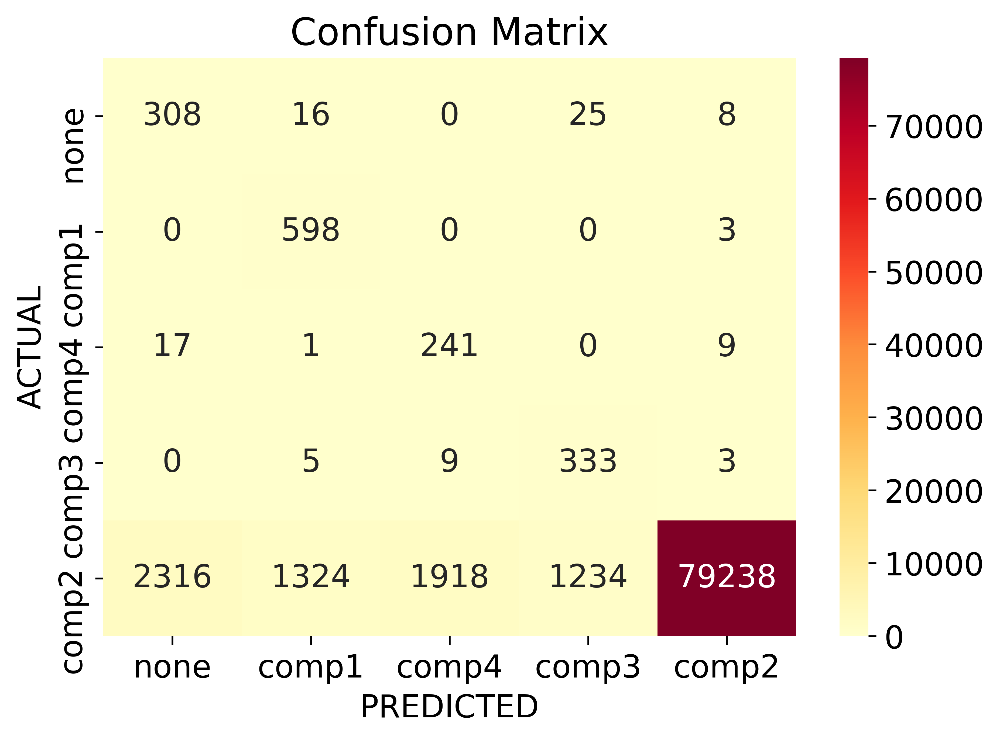


=======================================> PLOTS <=========================================


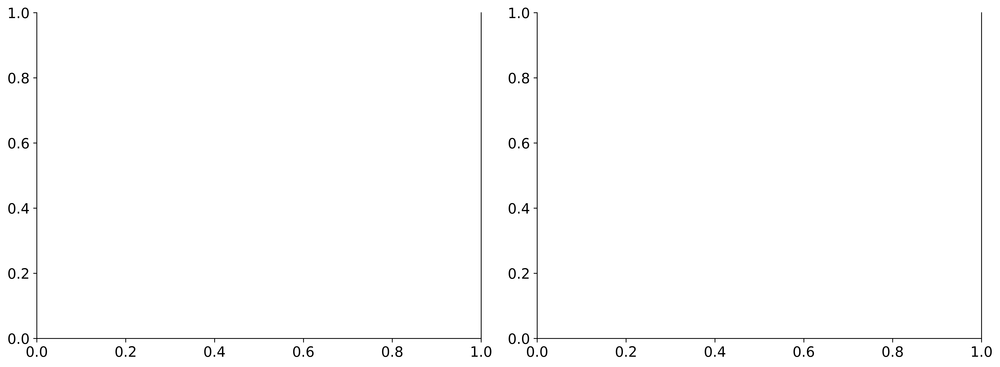

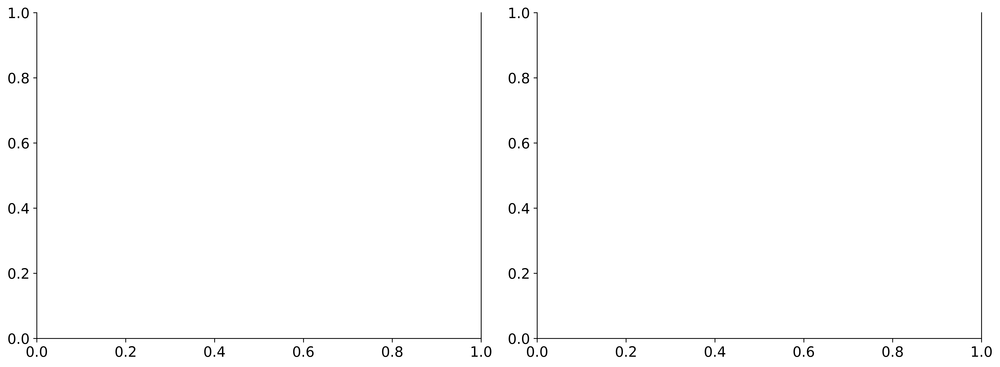

In [50]:
numeric_trans_nb = Pipeline(steps=[
    # ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('kbn', KBinsDiscretizer(n_bins=5, encode='ordinal'))])

categorical_trans_nb = Pipeline(steps=[
    ('ordinal', OrdinalEncoder(dtype=np.int8))]) # np.int8 = 0 to 255, 1 byte. ONLY POSITIVE INTEGERS

## Column Transformer
preprocessor_nb = ColumnTransformer(
    transformers=[
        ('num', numeric_trans_nb, numeric_columns),
        ('cat', categorical_trans_nb, categorical_columns)],
    remainder='passthrough')

## Applying Column Transformer
X_train_nb = preprocessor_nb.fit_transform(X_train_cat)
X_test_nb = preprocessor_nb.transform(X_test_cat)

nb_clf = GaussianNB() # ovr = one vs rest, ovo = one vs one

nb_clf, nb_report = report(nb_clf, X_train_nb, y_train,
                           X_test_nb, y_test, display_scores=[primary_eval_metric], refit=True, confusion_labels=confusion_lbs)

<a id="logistic-regression"></a>
### 5.3.   Logistic Regression

In [51]:
# logit = LogisticRegression(class_weight='balanced',
#                                 max_iter=500, penalty='l1',
#                                 # scoring='f1_weighted', 
#                                 # scoring='f1', 
#                                 solver='liblinear',
#                                 n_jobs=-1, random_state=rng,
#                                 # refit=True,
#                                 verbose=0)

# logit, logit_report = report(logit, X_train, y_train,
#                                 X_test, y_test,
#                                 display_scores=[primary_eval_metric],
#                                 importance_plot=True,
#                                 feature_labels=feature_names,
#                                 confusion_labels=confusion_lbs)

<a id="k-nearest-neighbors"></a>
### 5.4.   K-Nearest Neighbors
KNN estimator in Scikit-learn does not provide a way to pass class-weights to enable cost-sensitive/ class-weighted learning.

In [52]:
# knn = KNeighborsClassifier(n_neighbors=5, p=3, leaf_size=30,
#                            weights='distance', n_jobs=-1) # n_neighbors=5 because 5 classes

# knn, knn_report = report(knn, X_train, y_train,
#                          X_test, y_test,
#                          display_scores=[primary_eval_metric],
#                          importance_plot=True,
#                          feature_labels=feature_names,
#                          confusion_labels=confusion_lbs)

<a id="decision-tree"></a>
### 5.5.   Decision Tree

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=9, random_state=777)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 204413 samples
 Test Size: 87606 samples
---------------------------------------------
Training Time: 1.231762500000002 seconds
 Testing Time: 0.007190099999995425 seconds
---------------------------------------------
Train Accuracy:  0.9924319881807908
 Test Accuracy:  0.9938360386274913
---------------------------------------------
Train F1 Score:  0.9930364944598303
 Test F1 Score:  0.9942584751340968

---------------------------------------------
 Area Under ROC (test):  0.9772004565075685
---------------------------------------------
Model Memory Size: 35.126953125 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

        none       0.63      0.87      0.73     

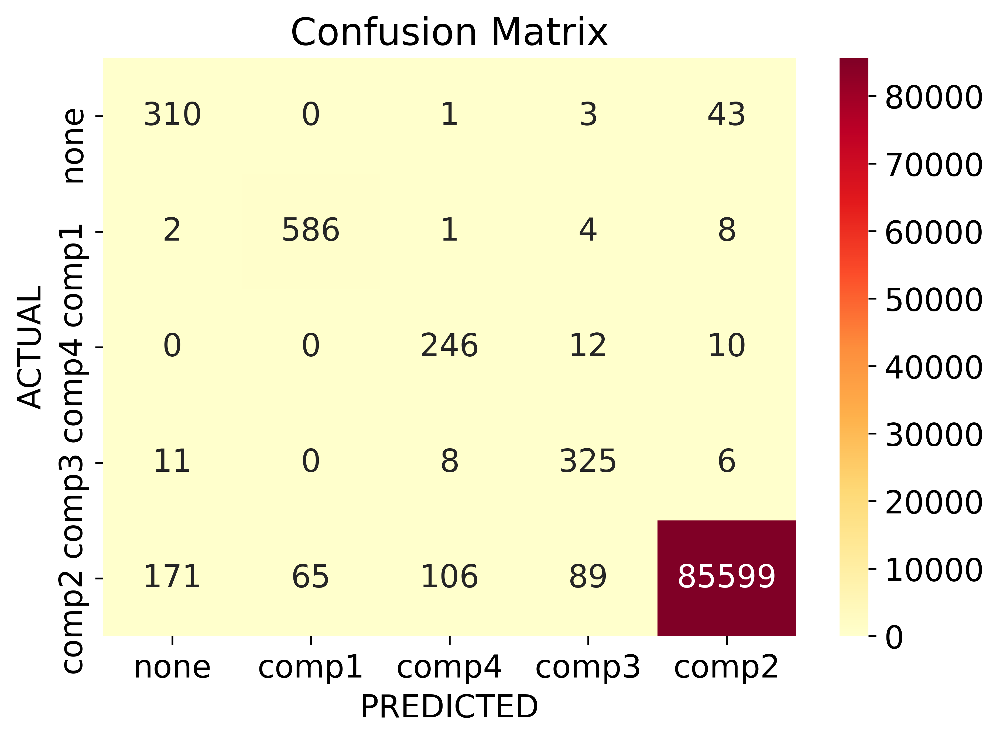


=======================================> PLOTS <=========================================


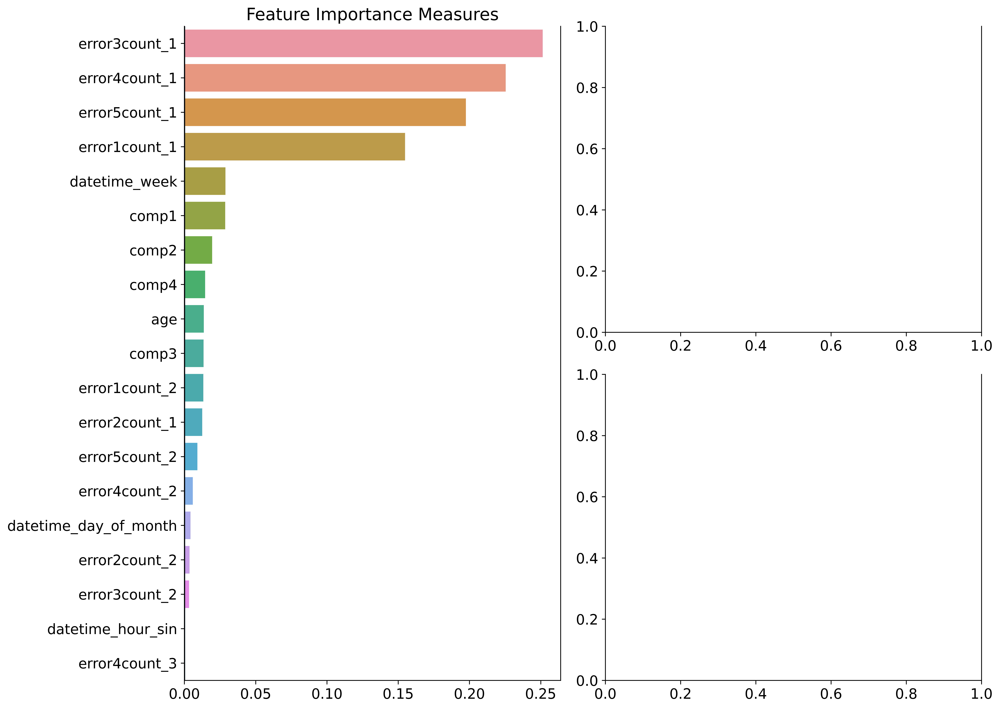

In [53]:
decision_tree = DecisionTreeClassifier(class_weight='balanced',
                                       criterion='entropy',
                                       max_depth=9, 
                                       # max_leaf_nodes=10,
                                    #    min_samples_split=0.2,
                                       random_state=rng)

decision_tree, decision_tree_report = report(decision_tree, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

<a id="decision-trees-with-bagging"></a>
### 5.6.   Decision Trees with Bagging

In [50]:
bagging_dtree = DecisionTreeClassifier(max_depth=9, class_weight='balanced',
                                       criterion='entropy', random_state=rng)

bagging_clf = BaggingClassifier(base_estimator=bagging_dtree,
                                # max_samples=0.745, 
                                n_estimators=100,
                                # max_features=0.37,
                                n_jobs=-1, random_state=rng)

In [51]:
bagging_clf

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                        criterion='entropy',
                                                        max_depth=9,
                                                        random_state=777),
                  n_estimators=100, n_jobs=-1, random_state=777)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                        criterion='entropy',
                                                        max_depth=9,
                                                        random_state=777),
                  n_estimators=100, n_jobs=-1, random_state=777)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 204413 samples
 Test Size: 87606 samples
---------------------------------------------
Training Time: 19.6474429 seconds
 Testing Time: 0.4981736000000012 seconds
---------------------------------------------
Train Accuracy:  0.9924662325781628
 Test Accuracy:  0.9943725315617652
---------------------------------------------
Train F1 Score:  0.9930656368893083
 Test F1 Score:  0.9947285663232771

---------------------------------------------
 Area Under ROC (test):  0.9925646307929522
----------------------------------------

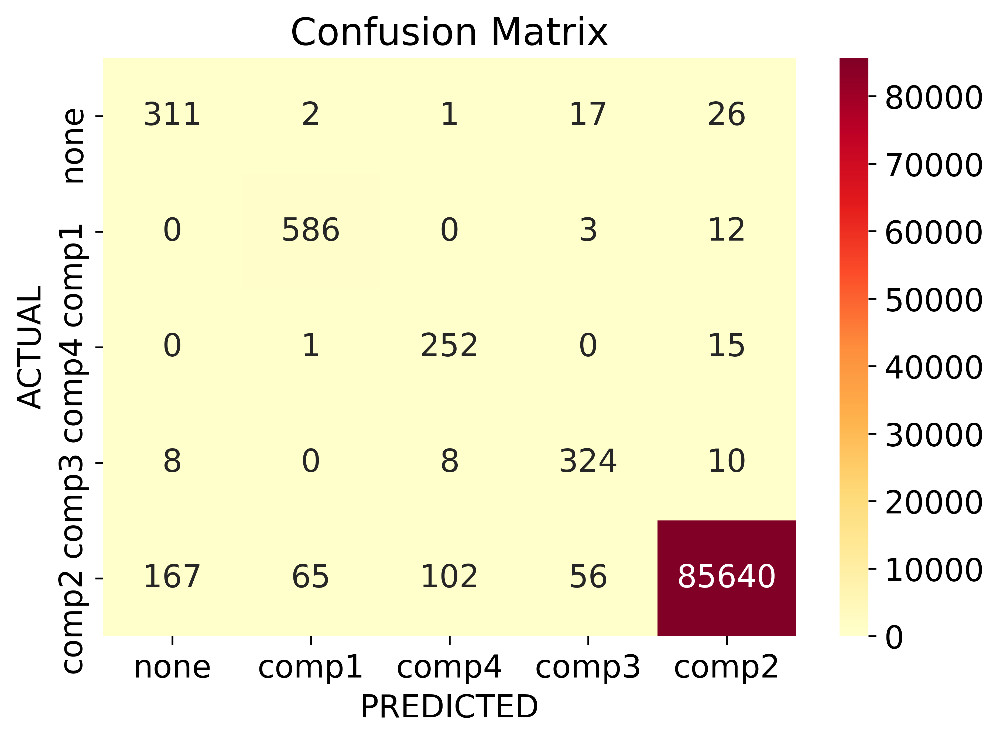


=======================================> PLOTS <=========================================


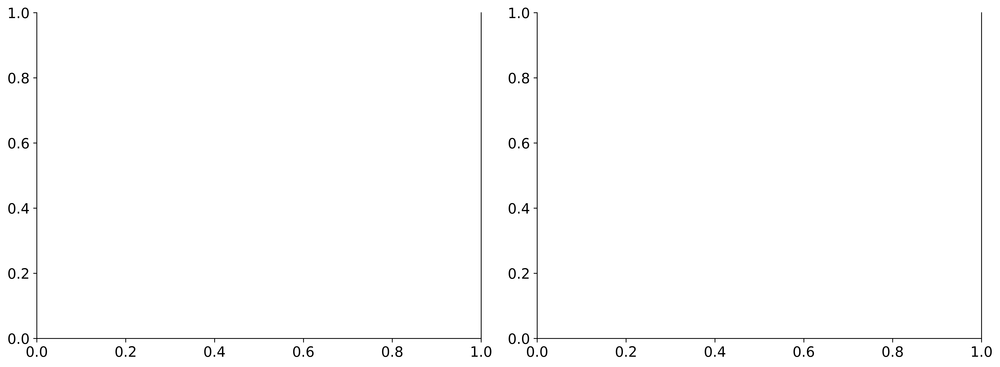

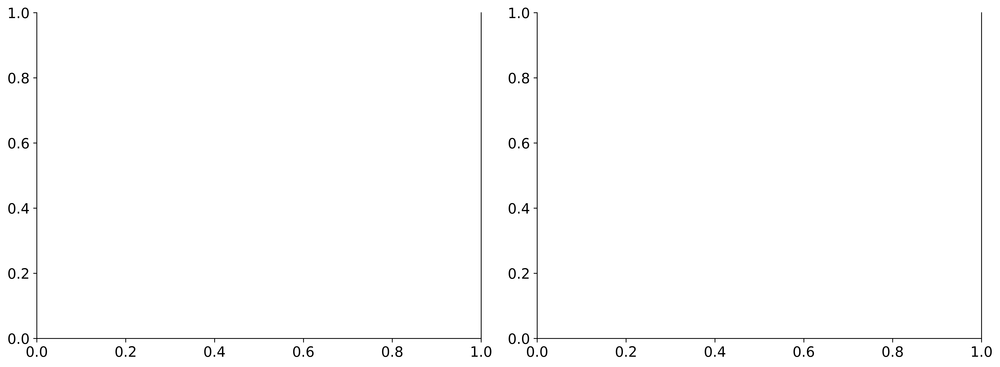

In [54]:
bagging_dtree = DecisionTreeClassifier(max_depth=9, class_weight='balanced',
                                       criterion='entropy', random_state=rng)

bagging_clf = BaggingClassifier(base_estimator=bagging_dtree,
                                # max_samples=0.745, 
                                n_estimators=100,
                                # max_features=0.37,
                                n_jobs=-1, random_state=rng)

bagging_clf, bagging_clf_report = report(bagging_clf, X_train, y_train,
                                         X_test, y_test,
                                         display_scores=[primary_eval_metric],
                                         feature_labels=feature_names,
                                         confusion_labels=confusion_lbs)

<a id="random-forests"></a>
### 5.7.   Random Forests

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=9, max_features=0.2, n_jobs=-1,
                       random_state=777)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 204413 samples
 Test Size: 87606 samples
---------------------------------------------
Training Time: 3.431184299999998 seconds
 Testing Time: 0.19496909999999446 seconds
---------------------------------------------
Train Accuracy:  0.9827554998948208
 Test Accuracy:  0.9825011985480446
---------------------------------------------
Train F1 Score:  0.9853093208786365
 Test F1 Score:  0.9855624039648655

---------------------------------------------
 Area Under ROC (test):  0.993636598009276
---------------------------------------------
Model Memory Size: 4366.970703125 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   suppo

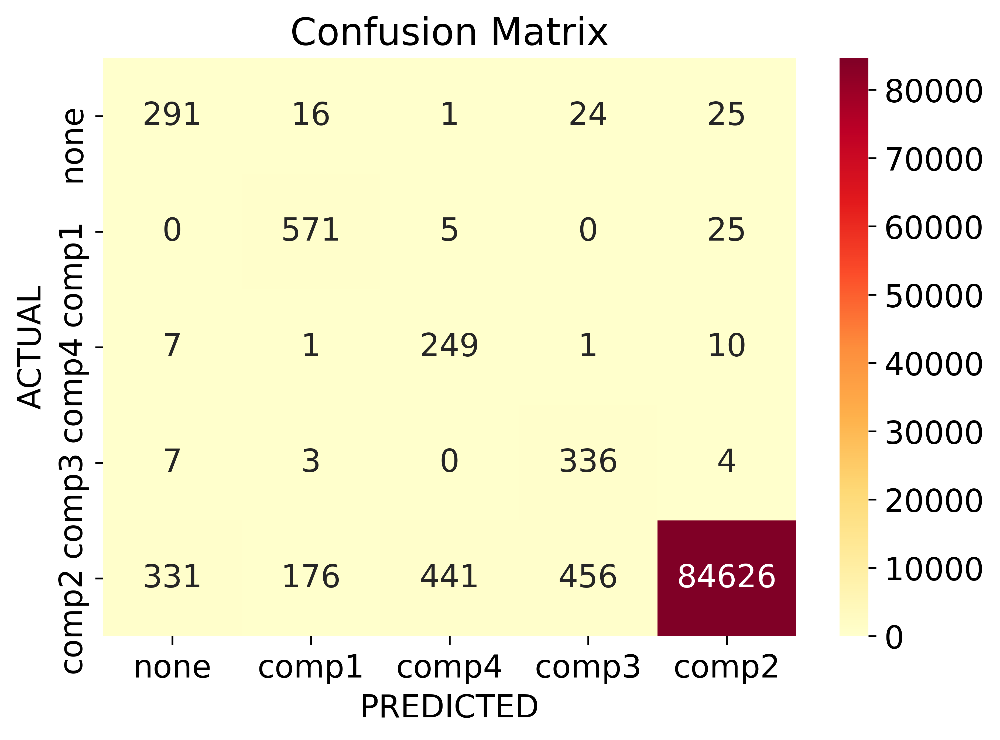


=======================================> PLOTS <=========================================


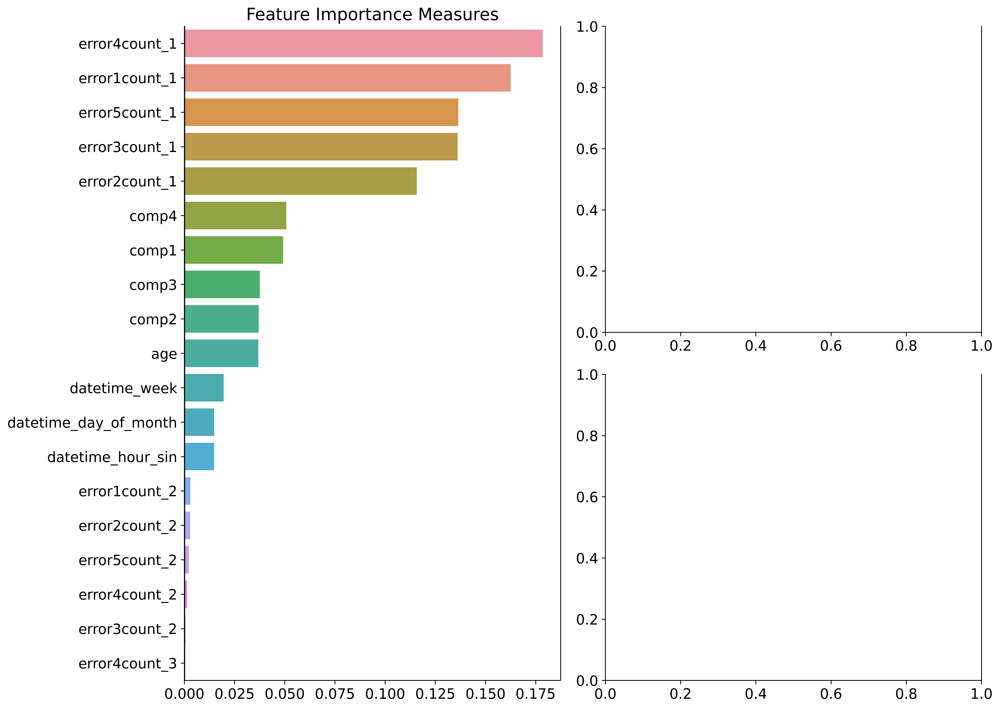

In [55]:
random_forest = RandomForestClassifier(class_weight='balanced', criterion='entropy',
                                       max_depth=9, 
                                       max_features=0.2,
                                       # max_samples=0.63, 
                                       n_estimators=100,
                                       n_jobs=-1, random_state=rng)

random_forest, random_forest_report = report(random_forest, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

<a id="decision-trees-with-adaboost"></a>
### 5.8.   Decision Trees with AdaBoost
The default base estimator for `AdaBoostClassifier` is `DecisionTreeClassifier(max_depth=1)`

AdaBoostClassifier(learning_rate=0.2, n_estimators=100, random_state=777)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 204413 samples
 Test Size: 87606 samples
---------------------------------------------
Training Time: 20.9091751 seconds
 Testing Time: 1.612817299999989 seconds
---------------------------------------------
Train Accuracy:  0.9778487669570918
 Test Accuracy:  0.9810743556377417
---------------------------------------------
Train F1 Score:  0.9699473209273821
 Test F1 Score:  0.9730396939533968

---------------------------------------------
 Area Under ROC (test):  0.8244944259024903
---------------------------------------------
Model Memory Size: 73.3056640625 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

        none       0.00      0.00      0.00       357
       comp1       0.18      0.03      0.05       60

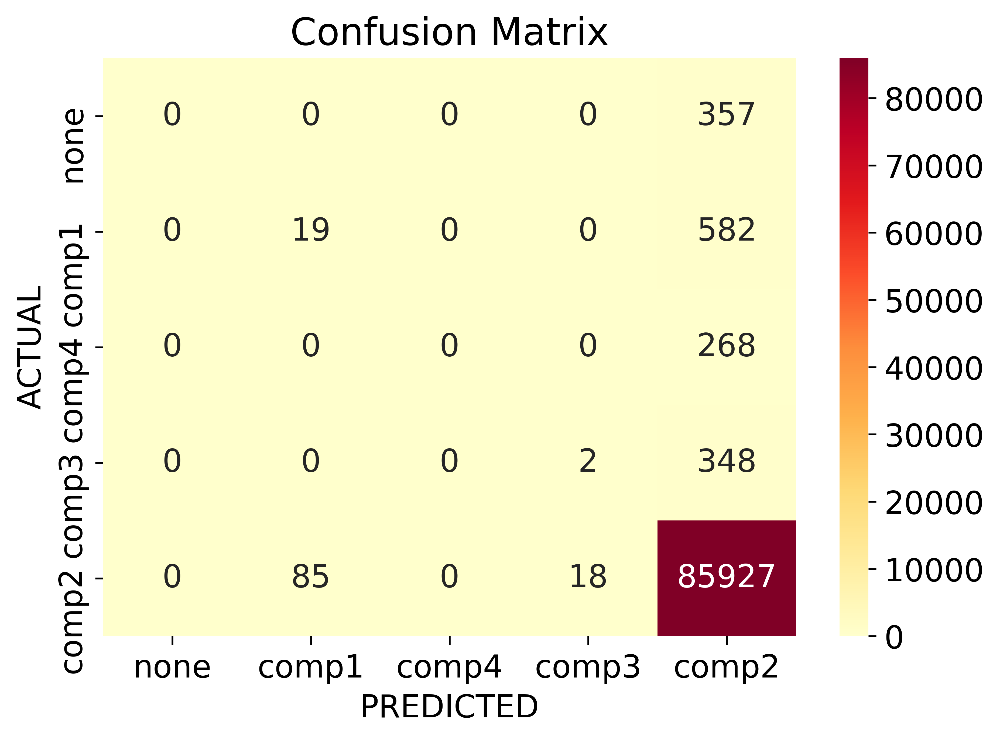


=======================================> PLOTS <=========================================


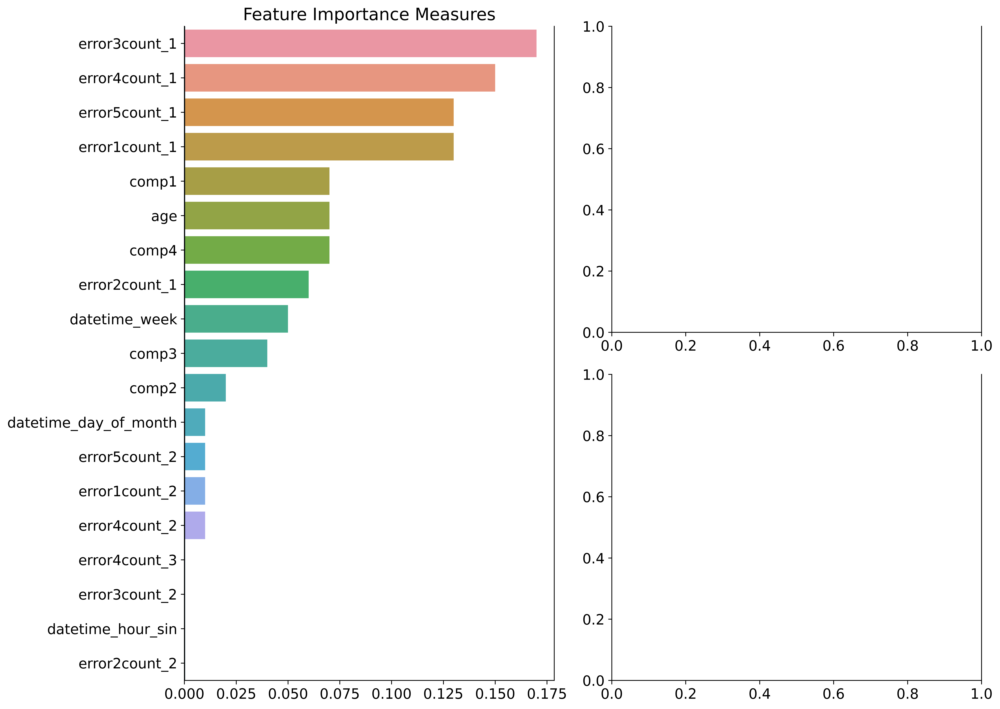

In [56]:
adaboot = AdaBoostClassifier(
n_estimators=100, 
# n_estimators=57, 
learning_rate=0.2,
# learning_rate=0.064,
random_state=rng)

adaboot, adaboot_report = report(adaboot, X_train, y_train,
                                 X_test, y_test,
                                 display_scores=[primary_eval_metric],
                                 importance_plot=True,
                                 feature_labels=feature_names,
                                 confusion_labels=confusion_lbs)

<a id="linear-svc"></a>
### 5.9.   Linear SVC

In [57]:
# linear_svc = SVC(C=2.1, kernel='linear', probability=True,
#                  decision_function_shape='ovr', # for multi-class classification
#                  class_weight='balanced', random_state=rng)

# linear_svc, linear_svc_report = report(linear_svc, X_train, y_train,
#                                        X_test, y_test,
#                                        display_scores=[primary_eval_metric],
#                                        importance_plot=True,
#                                        feature_labels=feature_names,
#                                        confusion_labels=confusion_lbs)

<a id="svm-with-rbf-kernel"></a>
### 5.10.   SVM with RBF kernel

In [58]:
# rbf_svc = SVC(C=0.20, kernel='rbf',
#             #   max_iter=100,
#               probability=True,
#               decision_function_shape='ovr', # for multi-class classification
#               class_weight='balanced', random_state=rng)

# rbf_svc, rbf_svc_report = report(rbf_svc, X_train, y_train,
#                                  X_test, y_test,
#                                  display_scores=[primary_eval_metric],
#                                  importance_plot=True,
#                                  feature_labels=feature_names,
#                                  confusion_labels=confusion_lbs)

<a id="xgboost"></a>
### 5.11.   XGBoost

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.002, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_class=array([0, 1, 2, 3, 4]), num_parallel_tree=None, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 204413 samples
 Test Size: 87606 samples
---------------------------------------------
Training Time: 0 seconds
 Testing Time: 0

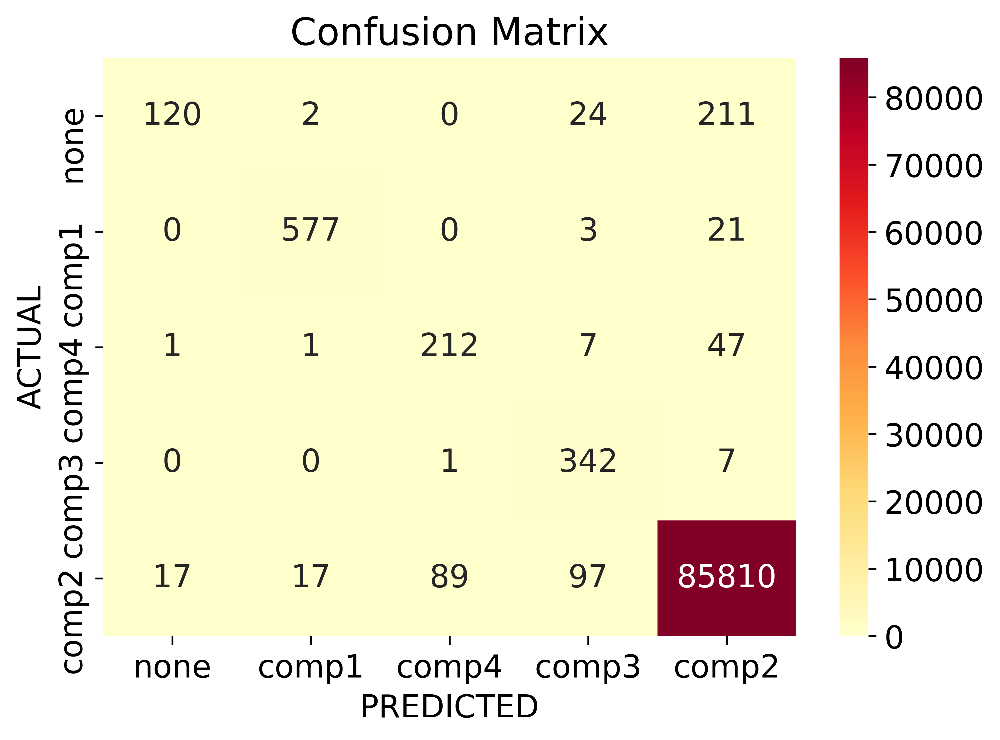


=======================================> PLOTS <=========================================


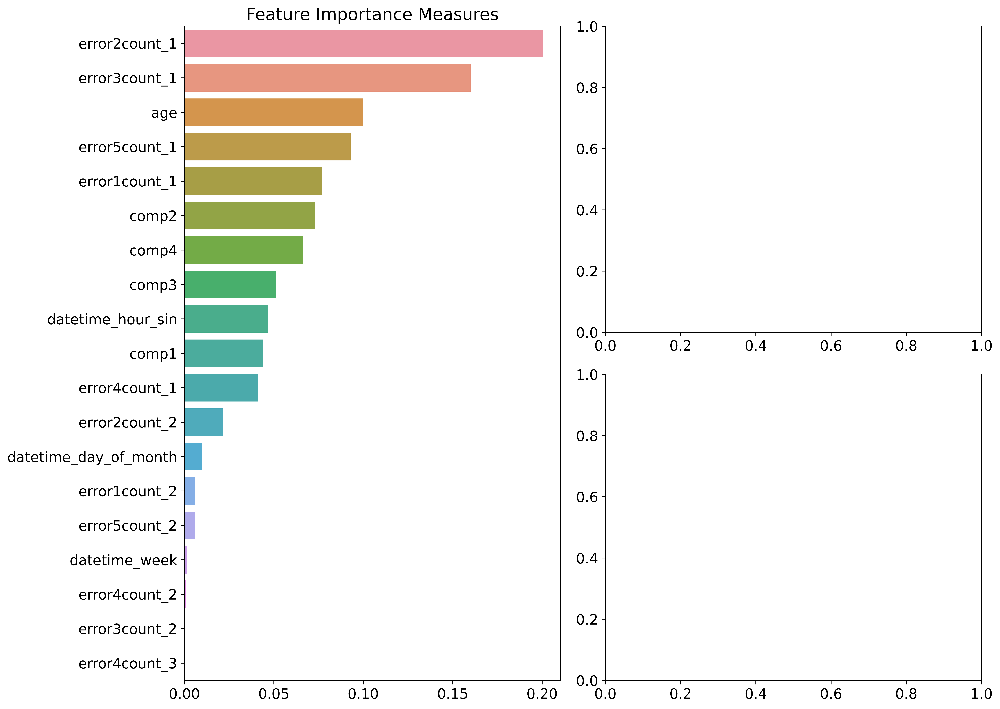

In [59]:
# cls_weight = (y_train.shape[0] - np.sum(y_train)) / np.sum(y_train)

cls_weight = compute_class_weight(class_weight='balanced',
                                    classes=np.unique(y_train),
                                    y=y_train)

params = {
    'learning_rate': 0.002,
    # 'learning_rate': 0.014724527414939945,
        #   'num_boost_round': 3451,
        #   'gamma': 0.4074467665676125,
        #   'reg_lambda': 31.082862686792716,
        #   'reg_alpha': 0.008543705214252668,
        #   'max_depth': 7,
          'max_depth': 5,
        #   'min_child_weight': 3.2435633342899867e-06,
        #   'subsample': 0.15432895096353877,
        #   'colsample_bytree': 0.7665394913603492
          }

xgb_clf = XGBClassifier(objective="multi:softmax", num_class=np.unique(y_train),
    **params, 
                        # scale_pos_weight=cls_weight,
                        random_state=rng, n_jobs=-1)
xgb_clf.fit(X_train, y_train);

xgb_clf, xgb_report = report(xgb_clf, X_train, y_train,
                             X_test, y_test,
                             display_scores=[primary_eval_metric],
                             importance_plot=True,
                             feature_labels=feature_names,
                             confusion_labels=confusion_lbs)

<a id="lightgbm"></a>
### 5.12.   LightGBM
LightGBM is similar to XGBoost but grows the trees in the ensemble based on Leaf-wise growth algorithm unlike Level-wise algorithm in XGBoost.

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1139
[LightGBM] [Info] Number of data points in the train set: 204413, number of used features: 18
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
LGBMClassifier(class_weight='balanced', learning_rate=0.004, n_jobs=-1,
               objective='multiclass', random_state=777)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 204413 samples
 Test Size: 87606 samples
---------------------------------------------
Training Time: 0 seconds
 Testing Time: 0.311595999999994

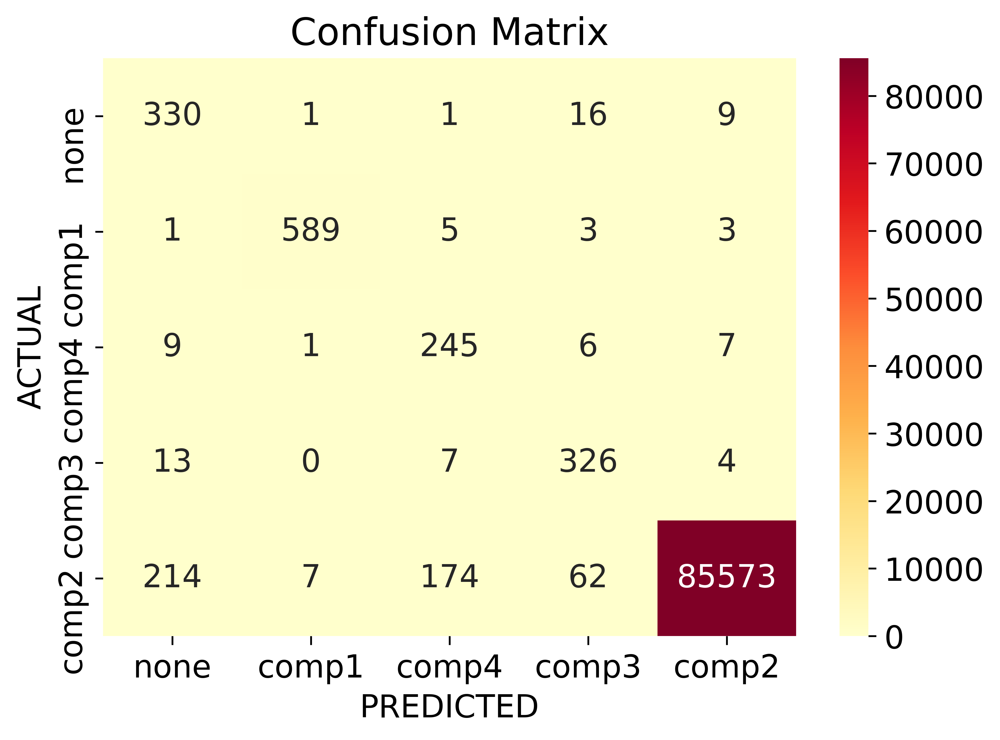


=======================================> PLOTS <=========================================


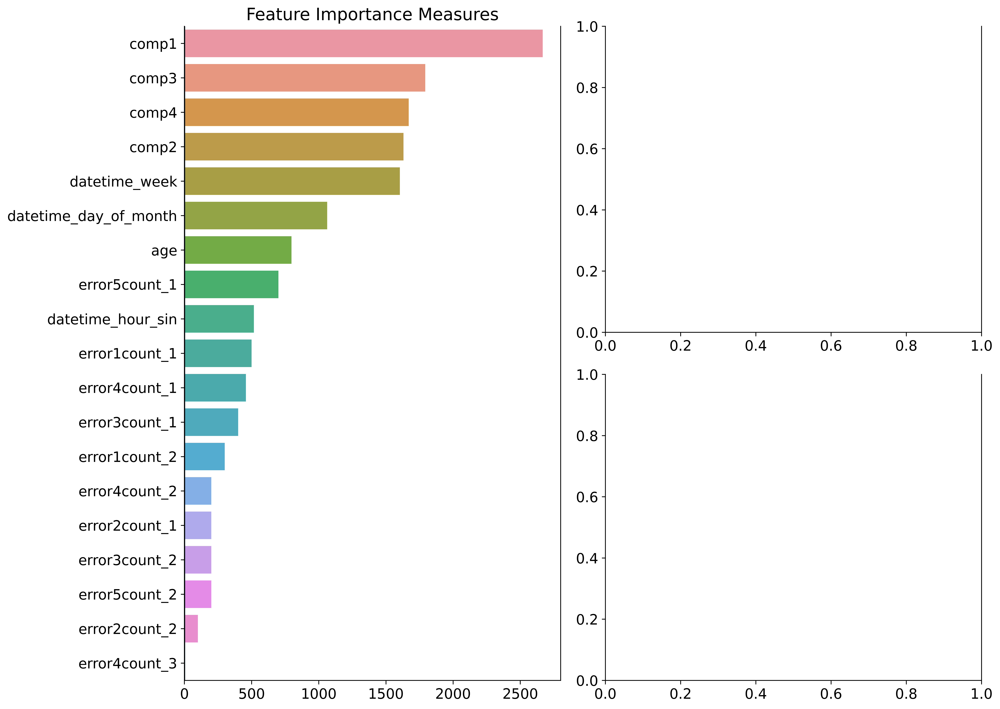

In [60]:
params = {
    'objective': 'multiclass',
    'learning_rate': 0.004,
    # 'objective': 'binary',
    # 'verbose': -1, 
    # 'lambda_l1': 0.0, 'lambda_l2': 0.0, 
    # 'num_leaves': 31, 'feature_fraction': 0.8,
    # 'bagging_fraction': 0.49916588402130324, 'bagging_freq': 3,
    # 'min_child_samples': 20
          }

lgbm_clf = LGBMClassifier(
    **params, 
    class_weight='balanced',
    n_estimators=100,
    random_state=rng, n_jobs=-1)
lgbm_clf.fit(X_train, y_train);

lgbm_clf, lgbm_report = report(lgbm_clf, X_train, y_train,
                               X_test, y_test,
                               display_scores=[primary_eval_metric],
                               importance_plot=True,
                               feature_labels=feature_names,
                               confusion_labels=confusion_lbs)

<a id="catboost"></a>
### 5.13.   CatBoost
Cat boost performs better without One-hot encoding because it performs an internal categorical encoding that is similar to Leave One Out Encoding (LOOE). So, we can give the dataframe as input to the catboost classifier.

0:	learn: 0.3924378	test: 0.3924408	best: 0.3924408 (0)	total: 182ms	remaining: 18s
1:	learn: 0.6332243	test: 0.6341627	best: 0.6341627 (1)	total: 449ms	remaining: 22s
2:	learn: 0.8208296	test: 0.8217540	best: 0.8217540 (2)	total: 777ms	remaining: 25.1s
3:	learn: 0.9105231	test: 0.9189246	best: 0.9189246 (3)	total: 1.06s	remaining: 25.4s
4:	learn: 0.9232682	test: 0.9264934	best: 0.9264934 (4)	total: 1.28s	remaining: 24.4s
5:	learn: 0.9280684	test: 0.9318876	best: 0.9318876 (5)	total: 1.49s	remaining: 23.4s
6:	learn: 0.9239329	test: 0.9342483	best: 0.9342483 (6)	total: 1.74s	remaining: 23.1s
7:	learn: 0.9305153	test: 0.9367252	best: 0.9367252 (7)	total: 1.95s	remaining: 22.4s
8:	learn: 0.9304816	test: 0.9381290	best: 0.9381290 (8)	total: 2.14s	remaining: 21.7s
9:	learn: 0.9304702	test: 0.9382543	best: 0.9382543 (9)	total: 2.35s	remaining: 21.2s
10:	learn: 0.9353566	test: 0.9434482	best: 0.9434482 (10)	total: 2.55s	remaining: 20.6s
11:	learn: 0.9438305	test: 0.9474129	best: 0.9474129 (11

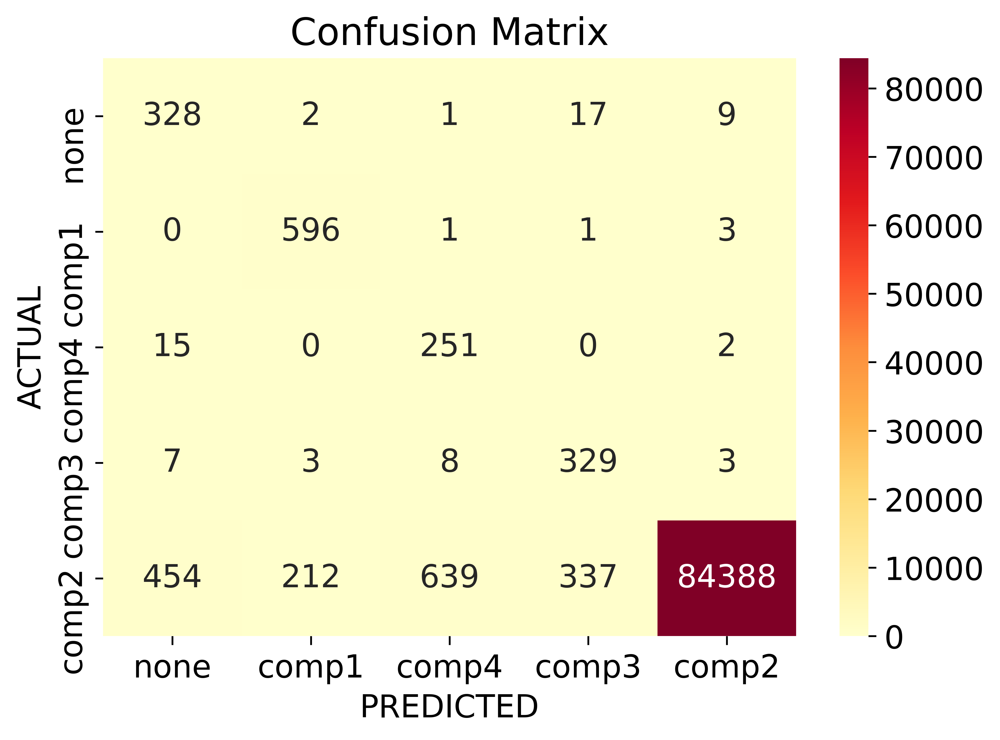


=======================================> PLOTS <=========================================


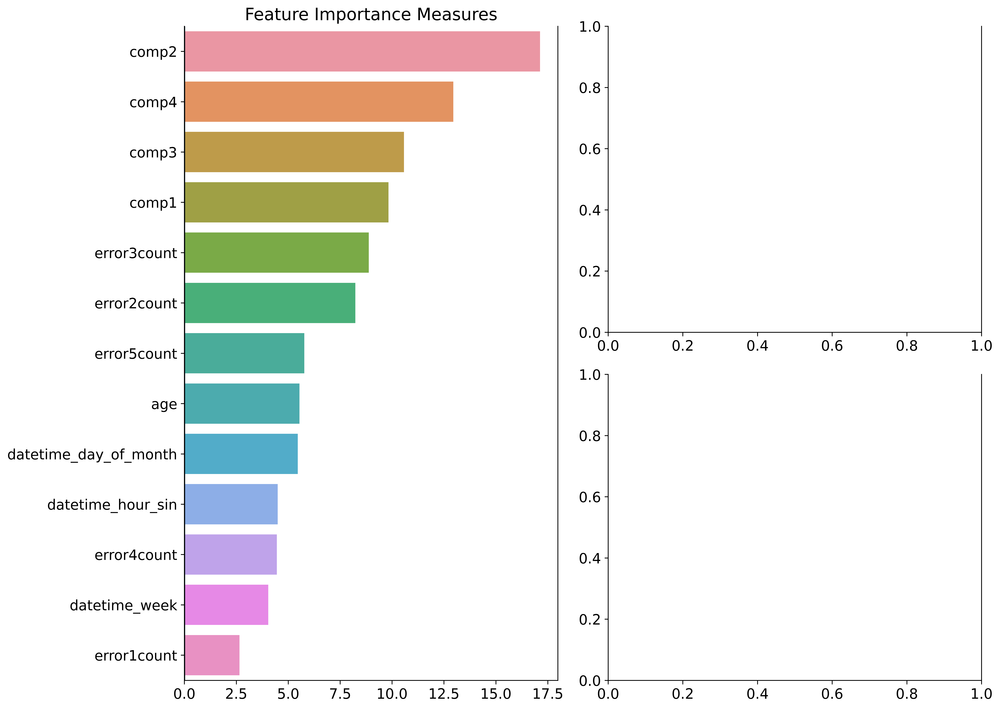

In [100]:
catboost_clf = CatBoostClassifier(cat_features=categorical_columns,
                                  loss_function='MultiClass', # for multi-class classification
                                  # l2_leaf_reg=120,
                                  depth=5,
                                  colsample_bylevel=0.7, # lower value helps to avoid overfitting
                                  auto_class_weights='Balanced',
                                  iterations=100, 
                                  learning_rate=0.2,
                                  use_best_model=True,
                                  early_stopping_rounds=15,
                                  eval_metric='Accuracy', 
                                #   eval_metric='F1', 
                                #   custom_metric='weighted_f1_score', # for multi-class classification
                                  random_state=rng)

catboost_clf.fit(X_train_cat, y_train, 
                 eval_set=(X_train_cat, y_train),
                 verbose=True)

f_labels = categorical_columns+numeric_columns
catboost_clf, catboost_report = report(catboost_clf, X_train_cat, y_train,
                                       X_test_cat, y_test,
                                       display_scores=[primary_eval_metric],
                                       importance_plot=True,
                                       feature_labels=f_labels,
                                       confusion_labels=confusion_lbs)

<a id="artificial-neural-networks"></a>
### 5.14 Artificial Neural Networks

In [51]:
tf.debugging.disable_traceback_filtering()

CLASS_WEIGHT = compute_class_weight(class_weight='balanced',
                                    classes=np.unique(y_train),
                                    y=y_train)
CLASS_WEIGHT = dict(enumerate(CLASS_WEIGHT)) # for multi-class classification

BATCHSIZE = X_train.shape[0]
FEATURES = X_train.shape[1]
CLASSES = len(confusion_lbs) # for multi-class classification
EPOCHS = 1000
N_TRAIN_EXAMPLES = X_train.shape[0]
STEPS_PER_EPOCH = N_TRAIN_EXAMPLES // BATCHSIZE

In [63]:
# from keras.utils import to_categorical

# # Convert your integer labels to one-hot encoded labels
# y_train = to_categorical(y_train, num_classes=len(confusion_lbs))
# y_test = to_categorical(y_test, num_classes=len(confusion_lbs))

#### NN

In [52]:
tf.keras.backend.clear_session()

In [53]:
modelNN = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(FEATURES,)), # input layer
    tf.keras.layers.BatchNormalization(), # batch normalization layer
    tf.keras.layers.Dense(32, activation='relu',
                                 kernel_initializer=tf.keras.initializers.GlorotUniform(seed=rng),
                                 kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.001, l2=0.001), # Elastic Net regularization
                                 use_bias=True), # dense layer
    tf.keras.layers.BatchNormalization(), # batch normalization layer
    tf.keras.layers.Dense(4, activation='relu'), # dense layer
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.Dense(8, activation='relu'), # dense layer
    tf.keras.layers.Dropout(0.2, seed=rng), # 
    tf.keras.layers.Dense(CLASSES, activation='softmax') # output shape is num classes, activation is softmax
])

modelNN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.002),
                # loss="categorical_crossentropy",
              loss="sparse_categorical_crossentropy",
              # loss="binary_crossentropy",
                metrics=['accuracy'])

modelNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 19)               76        
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 32)                640       
                                                                 
 batch_normalization_1 (Batc  (None, 32)               128       
 hNormalization)                                                 
                                                                 
 dense_1 (Dense)             (None, 4)                 132       
                                                                 
 dropout (Dropout)           (None, 4)                 0         
                                                                 
 dense_2 (Dense)             (None, 5)                 2

In [66]:
# # See the inputs and outputs of each layer
# plot_model(
#     modelNN, 
#     to_file='./Assets/Model_Architecture/modelNN.png',
#     show_shapes=True,
#     show_dtype=True,
#     show_layer_names=True,
#     rankdir='TB',
#     expand_nested=False,
#     dpi=600,
#     layer_range=None,
#     show_layer_activations=True
#     # show_trainable=True # after tf 2.10
# )

In [54]:
modelNN.add(visualkeras.SpacingDummyLayer(spacing=100))

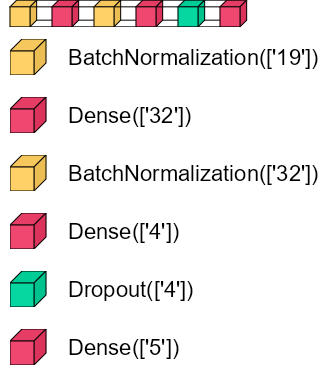

In [55]:
# visualkeras.layered_view(modelNN, legend=True, to_file='./Assets/Model_Architecture/vsk-modelNN.png').show()
visualkeras.layered_view(modelNN, font=font, draw_volume=True, show_dimension=True, spacing=22, legend=True, to_file='./Assets/Model_Architecture/vsk-modelNN.png')
# visualkeras.graph_view(modelNN, to_file='./Assets/Model_Architecture/vsk-modelNN.png')

# ann_viz(model=modelNN, view=True, filename="./Assets/Model_Architecture/vsk-modelNN.gv", title="Neural Network")

In [68]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (204413, 19)
y_train shape: (204413,)
X_test shape: (87606, 19)
y_test shape: (87606,)


In [69]:
# Callbacks for NNs
earlystopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', # stop training when the validation loss increases
    # min_delta = 1e-3, # 0.001
    patience = 25,
    mode = 'auto',
    restore_best_weights = True,
    verbose=1
)

checkpointer_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath = '../../code/machines/models/modelNN/modelNN-{epoch:02d}-{val_loss:.6f}-{val_accuracy:.6f}.h5',
    monitor = 'val_loss', 
    save_format='h5',
    overwrite=True,
    save_best_only = True,
    save_weights_only = False,
    mode = 'auto',
    verbose = 1,
)

nn_callback = [earlystopping_callback, checkpointer_callback]
# to read saved model
# saved_model = load_model('model_name.hdf5')

Epoch 1/1000
1/1 [==============================] - ETA: 0s - loss: 2.0087 - accuracy: 0.0130
Epoch 1: val_loss improved from inf to 1.96400, saving model to ../../code/machines/models/modelNN\modelNN-01-1.964003-0.004018.h5
1/1 [==============================] - 2s 2s/step - loss: 2.0087 - accuracy: 0.0130 - val_loss: 1.9640 - val_accuracy: 0.0040
Epoch 2/1000
1/1 [==============================] - ETA: 0s - loss: 1.9237 - accuracy: 0.0148
Epoch 2: val_loss improved from 1.96400 to 1.94990, saving model to ../../code/machines/models/modelNN\modelNN-02-1.949897-0.004041.h5
1/1 [==============================] - 0s 105ms/step - loss: 1.9237 - accuracy: 0.0148 - val_loss: 1.9499 - val_accuracy: 0.0040
Epoch 3/1000
1/1 [==============================] - ETA: 0s - loss: 1.8778 - accuracy: 0.1024
Epoch 3: val_loss improved from 1.94990 to 1.93632, saving model to ../../code/machines/models/modelNN\modelNN-03-1.936318-0.004086.h5
1/1 [==============================] - 0s 103ms/step - loss: 1

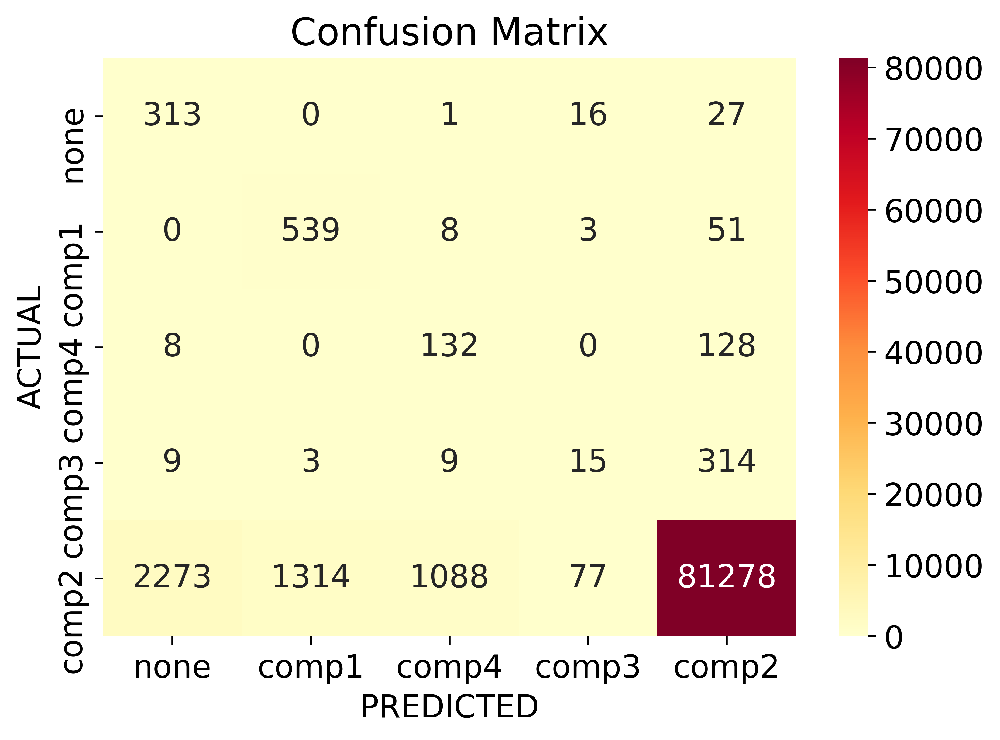


=======================================> PLOTS <=========================================


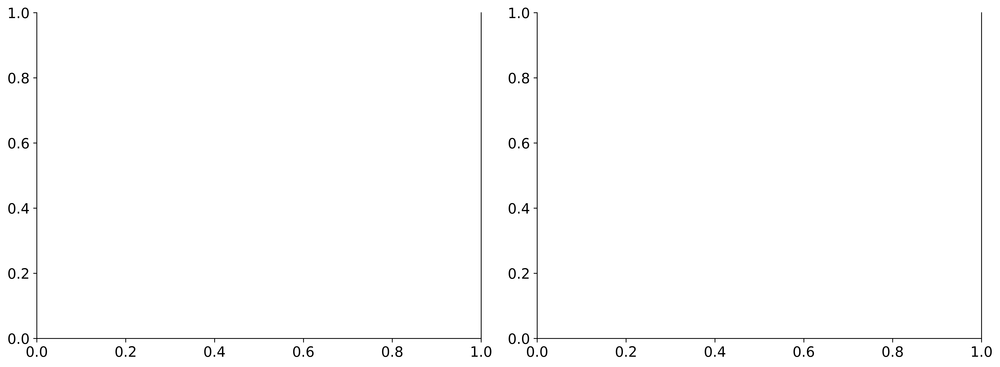

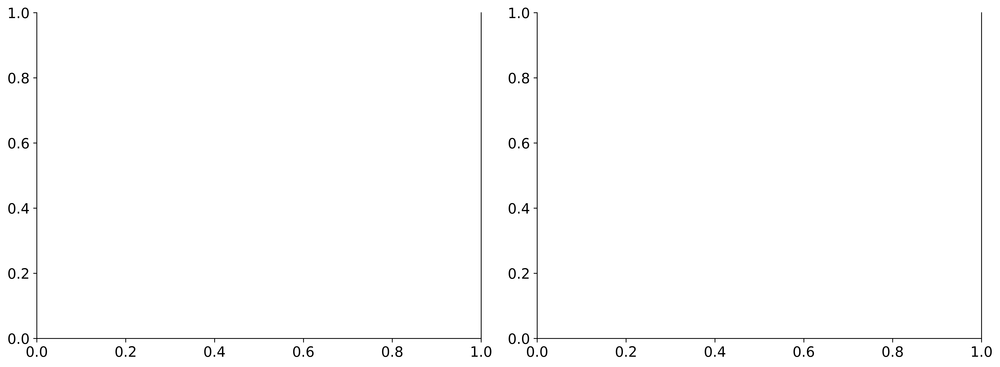

In [70]:
nn_history = modelNN.fit(x=X_train, y=y_train,
                    batch_size=BATCHSIZE,
                    epochs=EPOCHS,
                    verbose=1,
                    callbacks=nn_callback,
                    validation_data=(X_test, y_test),
                    shuffle=False,
                    class_weight=CLASS_WEIGHT,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    use_multiprocessing=True)

_, nn_report = report(modelNN, X_train, y_train,
                      X_test, y_test,
                    #   display_scores=[metrics.accuracy_score],
                      display_scores=[primary_eval_metric],
                      confusion_labels=confusion_lbs,
                      neural_net=True)

#### BiRNN-LSTM

In [56]:
tf.keras.backend.clear_session()

In [57]:
bi_rnn_lstm_modelNN = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(FEATURES,)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((1, FEATURES)),  # Reshape for LSTM input
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, activation='tanh', 
                                                       # tanh activation to use cuDNN
                                                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=rng),
                                                       kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.001, l2=0.001), # Elastic Net regularization
                                                       use_bias=True,
                                                       return_sequences=True)), # returns timesteps as well, so 3 dims
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, activation='tanh', 
    #                                                    # tanh activation to use cuDNN
    #                                                    return_sequences=True)),
    tf.keras.layers.BatchNormalization(), # batch normalization layer
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(2, activation='tanh', 
                                                       # tanh activation to use cuDNN
                                                       return_sequences=False)), # does not return timesteps, so 2 dims, last bidirectional layer must return_sequences=False
    
    tf.keras.layers.Dropout(0.1, seed=rng),
    tf.keras.layers.Dense(CLASSES, activation='softmax')
])
bi_rnn_lstm_modelNN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.002),
              loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])

bi_rnn_lstm_modelNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 19)               76        
 ormalization)                                                   
                                                                 
 reshape (Reshape)           (None, 1, 19)             0         
                                                                 
 bidirectional (Bidirectiona  (None, 1, 32)            4608      
 l)                                                              
                                                                 
 batch_normalization_1 (Batc  (None, 1, 32)            128       
 hNormalization)                                                 
                                                                 
 bidirectional_1 (Bidirectio  (None, 4)                560       
 nal)                                                   

In [73]:
# # See the inputs and outputs of each layer
# plot_model(
#     bi_rnn_lstm_modelNN, 
#     to_file='./Assets/Model_Architecture/bi_rnn_lstm_modelNN.png',
#     show_shapes=True,
#     show_dtype=True,
#     show_layer_names=True,
#     rankdir='TB',
#     expand_nested=False,
#     dpi=600,
#     layer_range=None,
#     show_layer_activations=True
#     # show_trainable=True # after tf 2.10
# )

In [58]:
bi_rnn_lstm_modelNN.add(visualkeras.SpacingDummyLayer(spacing=100))

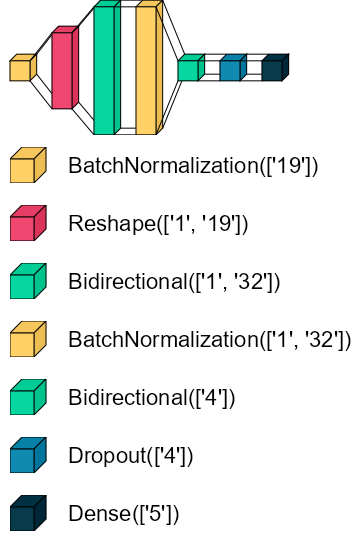

In [59]:
visualkeras.layered_view(bi_rnn_lstm_modelNN, font=font, draw_volume=True, show_dimension=True, spacing=22, legend=True, to_file='./Assets/Model_Architecture/bi_rnn_lstm_modelNN.png')

In [75]:
# Callbacks for NNs
earlystopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', # stop training when the validation loss increases
    # min_delta = 1e-3, # 0.001
    patience = 25,
    mode = 'auto',
    restore_best_weights = True,
    verbose=1
)

checkpointer_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath = '../../code/machines/models/bi_rnn_lstm_modelNN/bi_rnn_lstm_modelNN-{epoch:02d}-{val_loss:.6f}-{val_accuracy:.6f}.h5',
    monitor = 'val_loss', 
    save_format='h5',
    overwrite=True,
    save_best_only = True,
    save_weights_only = False,
    mode = 'auto',
    verbose = 1,
)

bi_rnn_lstm_modelNN_callback = [earlystopping_callback, checkpointer_callback]
# to read saved model
# saved_model = load_model('model_name.hdf5')

Epoch 1/1000
1/1 [==============================] - ETA: 0s - loss: 1.9104 - accuracy: 0.2794
Epoch 1: val_loss improved from inf to 1.97476, saving model to ../../code/machines/models/bi_rnn_lstm_modelNN\bi_rnn_lstm_modelNN-01-1.974763-0.410577.h5
1/1 [==============================] - 9s 9s/step - loss: 1.9104 - accuracy: 0.2794 - val_loss: 1.9748 - val_accuracy: 0.4106
Epoch 2/1000
1/1 [==============================] - ETA: 0s - loss: 1.8849 - accuracy: 0.2902
Epoch 2: val_loss improved from 1.97476 to 1.96798, saving model to ../../code/machines/models/bi_rnn_lstm_modelNN\bi_rnn_lstm_modelNN-02-1.967976-0.492090.h5
1/1 [==============================] - 0s 361ms/step - loss: 1.8849 - accuracy: 0.2902 - val_loss: 1.9680 - val_accuracy: 0.4921
Epoch 3/1000
1/1 [==============================] - ETA: 0s - loss: 1.8623 - accuracy: 0.3030
Epoch 3: val_loss improved from 1.96798 to 1.96112, saving model to ../../code/machines/models/bi_rnn_lstm_modelNN\bi_rnn_lstm_modelNN-03-1.961116-0.

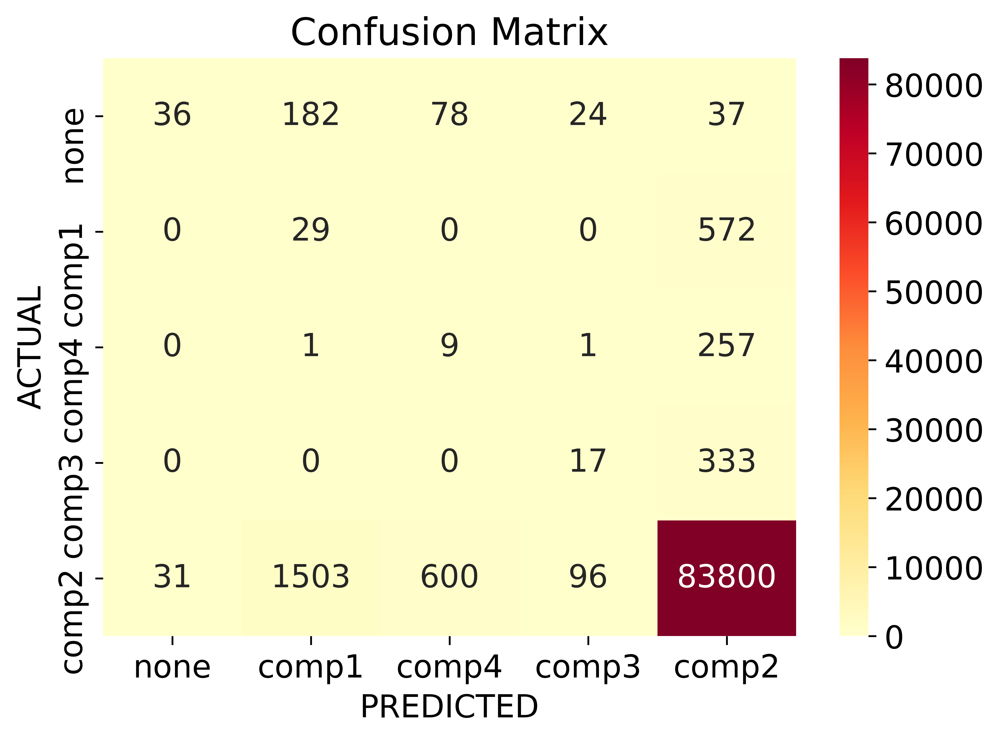


=======================================> PLOTS <=========================================


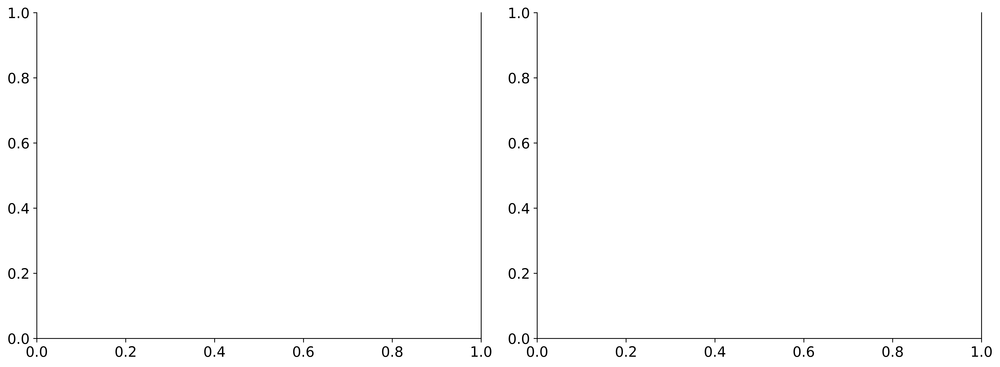

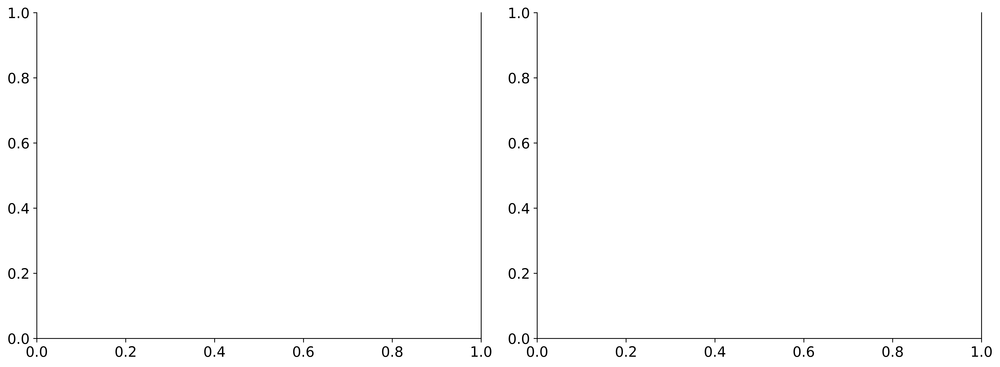

In [76]:
bi_rnn_lstm_nn_history = bi_rnn_lstm_modelNN.fit(x=X_train, y=y_train,
                    batch_size=BATCHSIZE,
                    epochs=EPOCHS,
                    verbose=1,
                    callbacks=bi_rnn_lstm_modelNN_callback,
                    validation_data=(X_test, y_test),
                    shuffle=False,
                    class_weight=CLASS_WEIGHT,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    use_multiprocessing=True)

_, bi_rnn_lstm_nn_report = report(bi_rnn_lstm_modelNN, X_train, y_train,
                      X_test, y_test,
                    #   display_scores=[metrics.accuracy_score],
                      display_scores=[primary_eval_metric],
                      confusion_labels=confusion_lbs,
                      neural_net=True)

#### CNN

In [60]:
tf.keras.backend.clear_session()

In [61]:
modelCNN = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(FEATURES,)),
    tf.keras.layers.BatchNormalization(), # batch normalization layer    
    tf.keras.layers.Reshape((FEATURES, 1)),  # Reshape input data for Conv1D
    tf.keras.layers.Conv1D(8, 3, activation='relu', padding='same',
                           kernel_initializer=tf.keras.initializers.GlorotUniform(seed=rng),
                           kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.001, l2=0.001), # Elastic Net regularization
                           use_bias=True),  # Add Conv1D layer
    tf.keras.layers.MaxPooling1D(2),  # Add MaxPooling1D layer
    tf.keras.layers.BatchNormalization(), # batch normalization layer
    tf.keras.layers.Conv1D(4, 3, activation='relu', padding='same'),  # Add another Conv1D layer
    tf.keras.layers.MaxPooling1D(2),  # Add another MaxPooling1D layer
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.Conv1D(8, 3, activation='relu', padding='same'),  # Add another Conv1D layer
    # tf.keras.layers.MaxPooling1D(2),  # Add another MaxPooling1D layer
    tf.keras.layers.Flatten(),  # flatten the output of the last pooling layer so it can be fed into dense layers
    tf.keras.layers.Dropout(0.2, seed=rng), # 
    tf.keras.layers.Dense(CLASSES, activation='softmax') # output shape is num classes, activation is softmax
])

modelCNN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.002),
              loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])

modelCNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 19)               76        
 ormalization)                                                   
                                                                 
 reshape (Reshape)           (None, 19, 1)             0         
                                                                 
 conv1d (Conv1D)             (None, 19, 8)             32        
                                                                 
 max_pooling1d (MaxPooling1D  (None, 9, 8)             0         
 )                                                               
                                                                 
 batch_normalization_1 (Batc  (None, 9, 8)             32        
 hNormalization)                                                 
                                                        

In [79]:
# # See the inputs and outputs of each layer
# plot_model(
#     modelCNN, 
#     to_file='./Assets/Model_Architecture/modelCNN.png',
#     show_shapes=True,
#     show_dtype=True,
#     show_layer_names=True,
#     rankdir='TB',
#     expand_nested=False,
#     dpi=600,
#     layer_range=None,
#     show_layer_activations=True
#     # show_trainable=True # after tf 2.10
# )

In [62]:
modelCNN.add(visualkeras.SpacingDummyLayer(spacing=100))

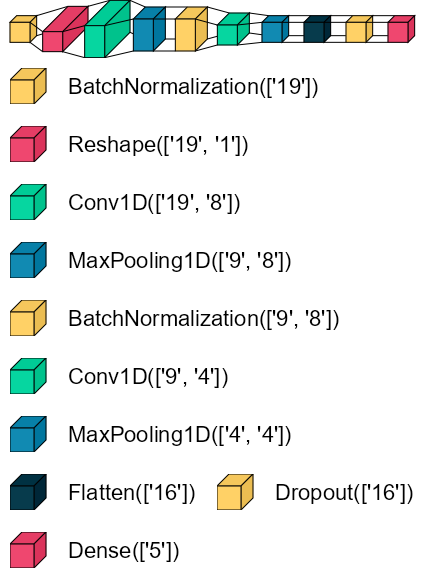

In [63]:
visualkeras.layered_view(modelCNN, font=font, draw_volume=True, show_dimension=True, spacing=22, legend=True, to_file='./Assets/Model_Architecture/modelCNN.png')

In [81]:
# Callbacks for NNs
earlystopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', # stop training when the validation loss increases
    # min_delta = 1e-3, # 0.001
    patience = 25,
    mode = 'auto',
    restore_best_weights = True,
    verbose=1
)

checkpointer_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath = '../../code/machines/models/modelCNN/modelCNN-{epoch:02d}-{val_loss:.6f}-{val_accuracy:.6f}.h5',
    monitor = 'val_loss',
    save_format='h5',
    overwrite=True,
    save_best_only = True,
    save_weights_only = False,
    mode = 'auto',
    verbose = 1,
)

modelCNN_callback = [earlystopping_callback, checkpointer_callback]
# to read saved model
# saved_model = load_model('model_name.hdf5')

Epoch 1/1000
1/1 [==============================] - ETA: 0s - loss: 3.5558 - accuracy: 0.3279
Epoch 1: val_loss improved from inf to 1.76004, saving model to ../../code/machines/models/modelCNN\modelCNN-01-1.760036-0.057519.h5
1/1 [==============================] - 3s 3s/step - loss: 3.5558 - accuracy: 0.3279 - val_loss: 1.7600 - val_accuracy: 0.0575
Epoch 2/1000
1/1 [==============================] - ETA: 0s - loss: 3.4339 - accuracy: 0.3265
Epoch 2: val_loss improved from 1.76004 to 1.75334, saving model to ../../code/machines/models/modelCNN\modelCNN-02-1.753345-0.058421.h5
1/1 [==============================] - 0s 154ms/step - loss: 3.4339 - accuracy: 0.3265 - val_loss: 1.7533 - val_accuracy: 0.0584
Epoch 3/1000
1/1 [==============================] - ETA: 0s - loss: 3.2572 - accuracy: 0.3241
Epoch 3: val_loss improved from 1.75334 to 1.74722, saving model to ../../code/machines/models/modelCNN\modelCNN-03-1.747216-0.059368.h5
1/1 [==============================] - 0s 151ms/step - l

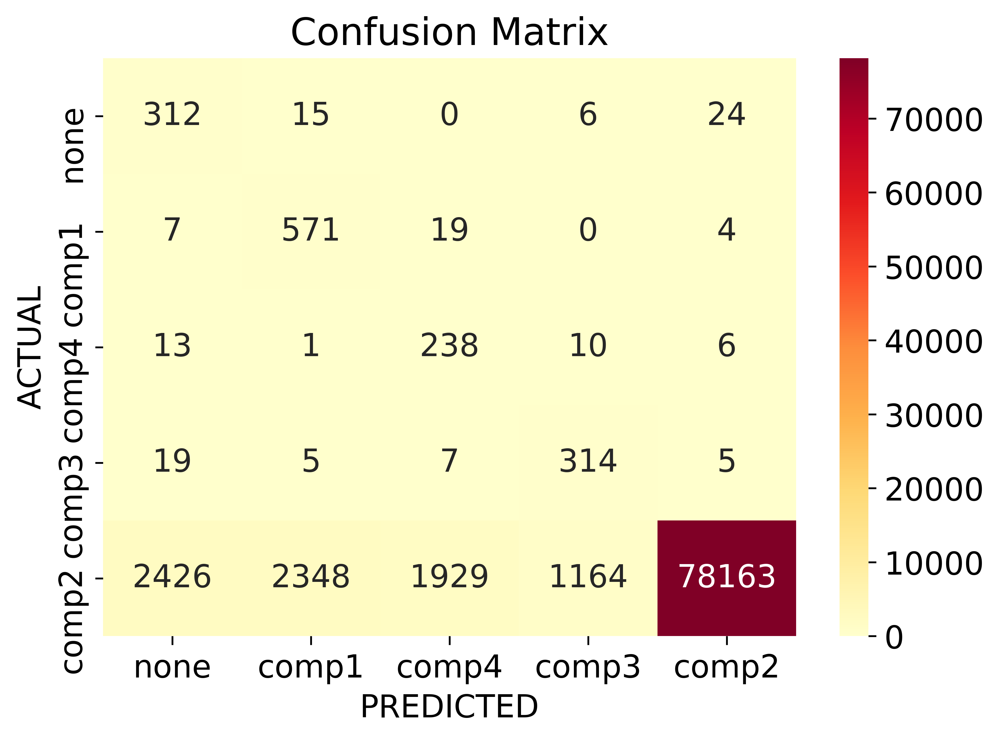


=======================================> PLOTS <=========================================


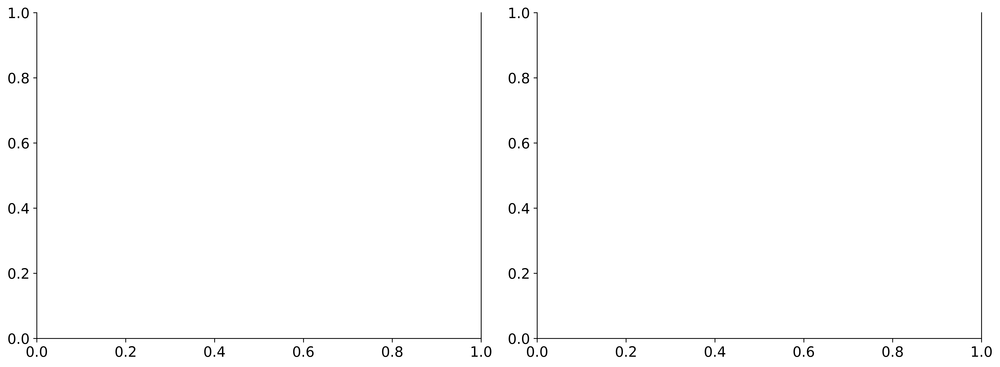

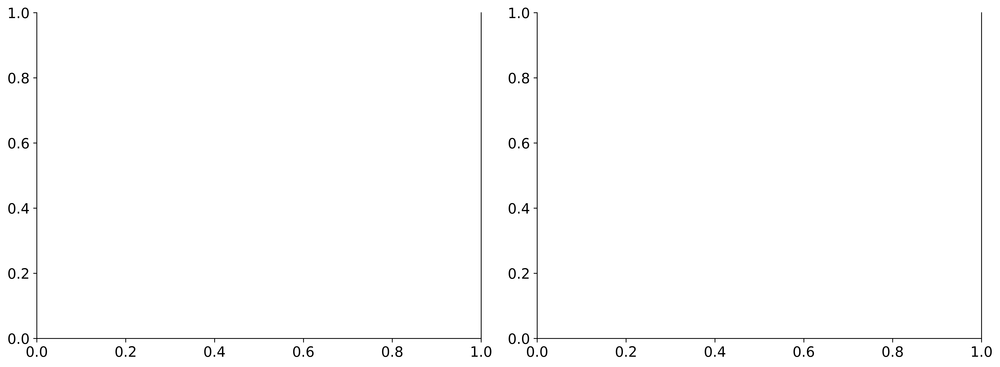

In [82]:
cnn_history = modelCNN.fit(x=X_train, y=y_train,
                    batch_size=BATCHSIZE,
                    epochs=EPOCHS,
                    verbose=1,
                    callbacks=modelCNN_callback,
                    validation_data=(X_test, y_test),
                    shuffle=False,
                    class_weight=CLASS_WEIGHT,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    use_multiprocessing=True)

_, cnn_report = report(modelCNN, X_train, y_train,
                      X_test, y_test,
                    #   display_scores=[metrics.accuracy_score],
                      display_scores=[primary_eval_metric],
                      confusion_labels=confusion_lbs,
                      neural_net=True)

#### CNN-LSTM

In [64]:
tf.keras.backend.clear_session()

In [65]:
cnn_lstm_modelNN = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(FEATURES,)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((FEATURES, 1, 1)),  # Reshape for LSTM input
    tf.keras.layers.ConvLSTM1D(4, kernel_size=1, activation='relu', padding='same', kernel_initializer=tf.keras.initializers.GlorotUniform(seed=rng),
                                                       kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.001, l2=0.001), # Elastic Net regularization
                                                       use_bias=True,
                                                       return_sequences=True), # returns timesteps as well, so 3 dims
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.ConvLSTM1D(2, kernel_size=1, activation='relu', padding='same', return_sequences=True),
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.ConvLSTM1D(8, kernel_size=1, activation='relu', padding='same', return_sequences=True),
    tf.keras.layers.Flatten(),  # flatten the output of the last pooling layer so it can be fed into dense layers
    tf.keras.layers.Dropout(0.1, seed=rng),
    tf.keras.layers.Dense(CLASSES, activation='softmax')
])
cnn_lstm_modelNN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.002),
              loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])

cnn_lstm_modelNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 19)               76        
 ormalization)                                                   
                                                                 
 reshape (Reshape)           (None, 19, 1, 1)          0         
                                                                 
 conv_lstm1d (ConvLSTM1D)    (None, 19, 1, 4)          96        
                                                                 
 flatten (Flatten)           (None, 76)                0         
                                                                 
 dropout (Dropout)           (None, 76)                0         
                                                                 
 dense (Dense)               (None, 5)                 385       
                                                        

In [85]:
# # See the inputs and outputs of each layer
# plot_model(
#     cnn_lstm_modelNN, 
#     to_file='./Assets/Model_Architecture/cnn_lstm_modelNN.png',
#     show_shapes=True,
#     show_dtype=True,
#     show_layer_names=True,
#     rankdir='TB',
#     expand_nested=False,
#     dpi=600,
#     layer_range=None,
#     show_layer_activations=True
#     # show_trainable=True # after tf 2.10
# )

In [66]:
cnn_lstm_modelNN.add(visualkeras.SpacingDummyLayer(spacing=100))

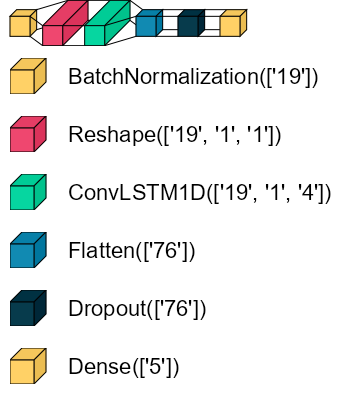

In [67]:
visualkeras.layered_view(cnn_lstm_modelNN, font=font, draw_volume=True, show_dimension=True, spacing=22, legend=True, to_file='./Assets/Model_Architecture/cnn_lstm_modelNN.png')

In [87]:
# Callbacks for NNs
earlystopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', # stop training when the validation loss increases
    # min_delta = 1e-3, # 0.001
    patience = 25,
    mode = 'auto',
    restore_best_weights = True,
    verbose=1
)

checkpointer_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath = '../../code/machines/models/cnn_lstm_modelNN/cnn_lstm_modelNN-{epoch:02d}-{val_loss:.6f}-{val_accuracy:.6f}.h5',
    monitor = 'val_loss',
    save_format='h5',
    overwrite=True,
    save_best_only = True,
    save_weights_only = False,
    mode = 'auto',
    verbose = 1,
)

cnn_lstm_modelNN_callback = [earlystopping_callback, checkpointer_callback]
# to read saved model
# saved_model = load_model('model_name.hdf5')

Epoch 1/1000
1/1 [==============================] - ETA: 0s - loss: 1.5962 - accuracy: 0.0080
Epoch 1: val_loss improved from inf to 1.72891, saving model to ../../code/machines/models/cnn_lstm_modelNN\cnn_lstm_modelNN-01-1.728909-0.004075.h5
1/1 [==============================] - 4s 4s/step - loss: 1.5962 - accuracy: 0.0080 - val_loss: 1.7289 - val_accuracy: 0.0041
Epoch 2/1000
1/1 [==============================] - ETA: 0s - loss: 1.5911 - accuracy: 0.0097
Epoch 2: val_loss improved from 1.72891 to 1.71773, saving model to ../../code/machines/models/cnn_lstm_modelNN\cnn_lstm_modelNN-02-1.717726-0.004075.h5
1/1 [==============================] - 0s 274ms/step - loss: 1.5911 - accuracy: 0.0097 - val_loss: 1.7177 - val_accuracy: 0.0041
Epoch 3/1000
1/1 [==============================] - ETA: 0s - loss: 1.5837 - accuracy: 0.0123
Epoch 3: val_loss improved from 1.71773 to 1.70668, saving model to ../../code/machines/models/cnn_lstm_modelNN\cnn_lstm_modelNN-03-1.706679-0.004075.h5
1/1 [===

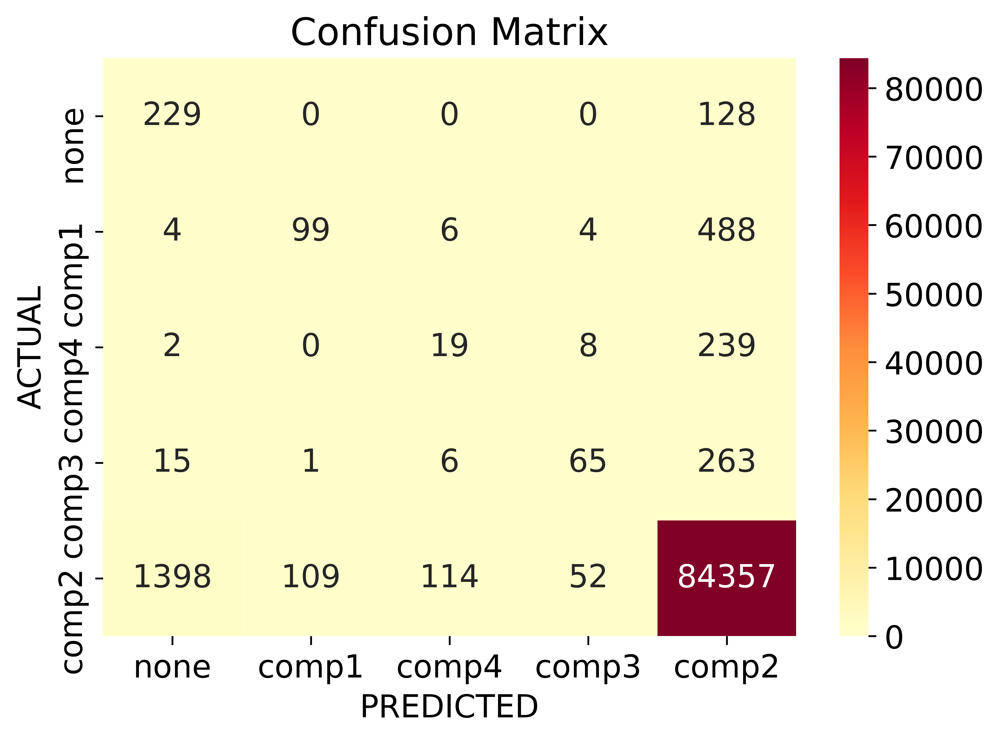


=======================================> PLOTS <=========================================


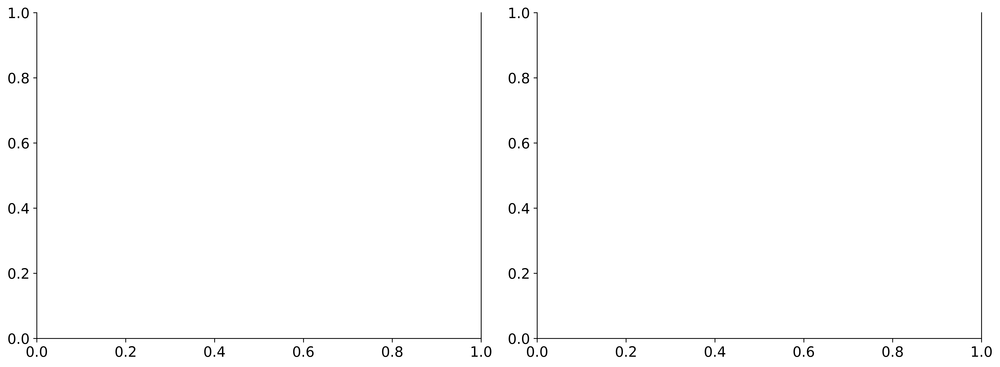

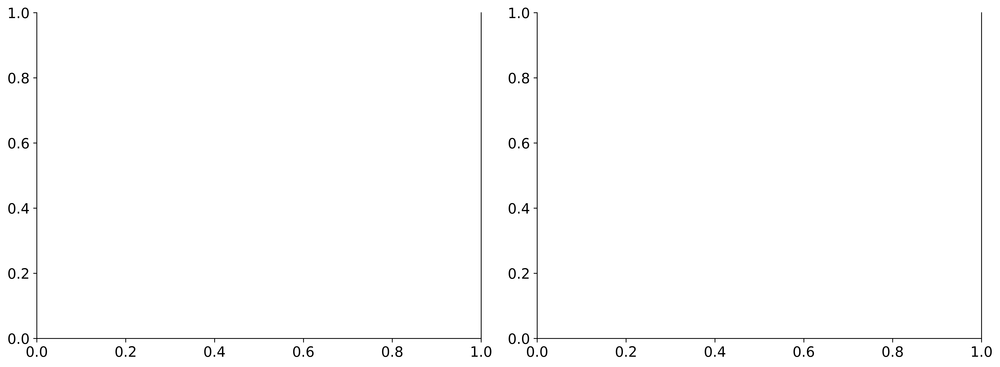

In [88]:
cnn_lstm_history = cnn_lstm_modelNN.fit(x=X_train, y=y_train,
                    batch_size=BATCHSIZE,
                    epochs=EPOCHS,
                    verbose=1,
                    callbacks=cnn_lstm_modelNN_callback,
                    validation_data=(X_test, y_test),
                    shuffle=False,
                    class_weight=CLASS_WEIGHT,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    use_multiprocessing=True)

_, cnn_lstm_nn_report = report(cnn_lstm_modelNN, X_train, y_train,
                      X_test, y_test,
                    #   display_scores=[metrics.accuracy_score],
                      display_scores=[primary_eval_metric],
                      confusion_labels=confusion_lbs,
                      neural_net=True)

<a id="model-comparison"></a>
## 6.   Model Comparison

In [101]:
report_list = [
   nb_report, 
   # logit_report, 
   # knn_report, 
   decision_tree_report,               
   bagging_clf_report, random_forest_report, adaboot_report,
   xgb_report, 
   lgbm_report, catboost_report, 
   cnn_lstm_nn_report,
   cnn_report,
   bi_rnn_lstm_nn_report,
   nn_report,
   # linear_svc_report, 
   # rbf_svc_report
]
clf_labels = [rep['clf'].__class__.__name__ for rep in report_list]
clf_labels[-4] = 'Convolutional LSTM Neural Net'
clf_labels[-3] = 'Convolutional Neural Net'
clf_labels[-2] = 'BiRNN LSTM Neural Net'
clf_labels[-1] = 'Artificial Neural Net'
# clf_labels[-2] = 'Linear SVC'
# clf_labels[-1] = 'RBF SVClassifier'

<a id="evaluation-metrics"></a>
### 6.1.   Evaluation Metrics

Sorted by "Test f1_score" in descending order

In [102]:
compare_table = compare_models(y_test, clf_reports=report_list,
# compare_table, compare_plot = compare_models(y_test, clf_reports=report_list,
                                             labels=clf_labels,
                                             score=primary_eval_metric.__name__)

# compare_table.sort_values(by=['Overfitting', 'Accuracy'], ascending=[True, False])
compare_table.sort_values(by=['Test f1_score', 'Overfitting'], ascending=[False, False])

,Train f1_score,Test f1_score,Overfitting,Train Accuracy,Test Accuracy,Test ROC-AUC
BaggingClassifier,0.993066,0.994729,False,0.992466,0.994373,0.992565
LGBMClassifier,0.993131,0.99447,False,0.992275,0.993802,0.992677
DecisionTreeClassifier,0.993036,0.994258,False,0.992432,0.993836,0.9772
XGBClassifier,0.993043,0.993304,False,0.993733,0.993779,0.99286
RandomForestClassifier,0.985309,0.985562,False,0.982755,0.982501,0.993637
CatBoostClassifier,0.983746,0.984394,False,0.98028,0.980435,0.994909
AdaBoostClassifier,0.969947,0.97304,False,0.977849,0.981074,0.824494
Convolutional LSTM Neural Net,0.958015,0.970003,False,0.942831,0.967616,0.950247
BiRNN LSTM Neural Net,0.95516,0.963522,False,0.945424,0.957594,0.93533
Artificial Neural Net,0.945871,0.95583,False,0.922676,0.939171,0.937295


#### Copy table to clip to paste in document

In [103]:
# compare_table.sort_values(by=['Test f1_score', 'Overfitting'], ascending=[False, False]).to_clipboard(sep=',', index=True)

Sorted by "Test f1_score" in descending order (Filtered "Overfitting" == False)

In [104]:
# Exclude overfitting models
compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test f1_score'], ascending=False)

,Train f1_score,Test f1_score,Overfitting,Train Accuracy,Test Accuracy,Test ROC-AUC
BaggingClassifier,0.993066,0.994729,False,0.992466,0.994373,0.992565
LGBMClassifier,0.993131,0.99447,False,0.992275,0.993802,0.992677
DecisionTreeClassifier,0.993036,0.994258,False,0.992432,0.993836,0.9772
XGBClassifier,0.993043,0.993304,False,0.993733,0.993779,0.99286
RandomForestClassifier,0.985309,0.985562,False,0.982755,0.982501,0.993637
CatBoostClassifier,0.983746,0.984394,False,0.98028,0.980435,0.994909
AdaBoostClassifier,0.969947,0.97304,False,0.977849,0.981074,0.824494
Convolutional LSTM Neural Net,0.958015,0.970003,False,0.942831,0.967616,0.950247
BiRNN LSTM Neural Net,0.95516,0.963522,False,0.945424,0.957594,0.93533
Artificial Neural Net,0.945871,0.95583,False,0.922676,0.939171,0.937295


#### Copy table to clip to paste in document

In [105]:
# compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test f1_score'], ascending=False).to_clipboard(sep=',', index=True)

Sorted by "Test Accuracy" in descending order (Filtered "Overfitting" == False)

In [106]:
# Exclude overfitting models
compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test Accuracy'], ascending=False)

,Train f1_score,Test f1_score,Overfitting,Train Accuracy,Test Accuracy,Test ROC-AUC
BaggingClassifier,0.993066,0.994729,False,0.992466,0.994373,0.992565
DecisionTreeClassifier,0.993036,0.994258,False,0.992432,0.993836,0.9772
LGBMClassifier,0.993131,0.99447,False,0.992275,0.993802,0.992677
XGBClassifier,0.993043,0.993304,False,0.993733,0.993779,0.99286
RandomForestClassifier,0.985309,0.985562,False,0.982755,0.982501,0.993637
AdaBoostClassifier,0.969947,0.97304,False,0.977849,0.981074,0.824494
CatBoostClassifier,0.983746,0.984394,False,0.98028,0.980435,0.994909
Convolutional LSTM Neural Net,0.958015,0.970003,False,0.942831,0.967616,0.950247
BiRNN LSTM Neural Net,0.95516,0.963522,False,0.945424,0.957594,0.93533
Artificial Neural Net,0.945871,0.95583,False,0.922676,0.939171,0.937295


#### Copy table to clip to paste in document

In [107]:
# compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test Accuracy'], ascending=False).to_clipboard(sep=',', index=True)

Sorted by "Test ROC-AUC" in descending order (Filtered "Overfitting" == False)

In [108]:
# Exclude overfitting models
compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test ROC-AUC'], ascending=False)

,Train f1_score,Test f1_score,Overfitting,Train Accuracy,Test Accuracy,Test ROC-AUC
CatBoostClassifier,0.983746,0.984394,False,0.98028,0.980435,0.994909
RandomForestClassifier,0.985309,0.985562,False,0.982755,0.982501,0.993637
XGBClassifier,0.993043,0.993304,False,0.993733,0.993779,0.99286
LGBMClassifier,0.993131,0.99447,False,0.992275,0.993802,0.992677
BaggingClassifier,0.993066,0.994729,False,0.992466,0.994373,0.992565
DecisionTreeClassifier,0.993036,0.994258,False,0.992432,0.993836,0.9772
GaussianNB,0.944976,0.947558,False,0.919296,0.921375,0.973834
Convolutional Neural Net,0.936568,0.939713,False,0.905862,0.908591,0.957931
Convolutional LSTM Neural Net,0.958015,0.970003,False,0.942831,0.967616,0.950247
Artificial Neural Net,0.945871,0.95583,False,0.922676,0.939171,0.937295


#### Copy table to clip to paste in document

In [109]:
# compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test ROC-AUC'], ascending=False).to_clipboard(sep=',', index=True)

<a id="roc-and-pr-curves"></a>
### 6.2.   ROC and PR Curves

In [110]:
# compare_plot